In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn import cluster, datasets
from pandas import DataFrame as df
from IPython.display import clear_output

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import learning_curve

import keras
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers.core import  Activation, Dropout  
from keras.optimizers import RMSprop
from keras.layers import Embedding, RepeatVector
from keras.layers import LSTM
from keras.layers.recurrent import GRU
from keras.optimizers import SGD
from sklearn.preprocessing import MinMaxScaler

from __future__ import print_function
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.sandbox.regression.predstd import wls_prediction_std

import datetime
from datetime import timedelta

%matplotlib inline
#%matplotlib qt
%config InlineBackend.figure_format = 'retina'

/Users/mac/anaconda/lib/python2.7/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using Theano backend.
/Users/mac/anaconda/lib/python2.7/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [4]:
def import_data():
    dataset = pd.read_csv('data/DP.csv',usecols=[27],engine='python',skipfooter=0)
    return dataset
def mean_absolute_percentage_error(y_true, y_pred): 

    ## Note: does not handle mix 1d representation
    #if _is_1d(y_true): 
    #    y_true, y_pred = _check_1d_array(y_true, y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def mean_absolute_error(y_true, y_pred): 

    ## Note: does not handle mix 1d representation
    #if _is_1d(y_true): 
    #    y_true, y_pred = _check_1d_array(y_true, y_pred)
    return np.mean(np.abs((y_true - y_pred) )) 

def rmse(predictions, targets):
    return np.sqrt(((predictions - targets) ** 2).mean())

def prepareInputs(daydata, season, UsedInputs,testPeriod):
    nbrInputs= 0
    
    previousHours = UsedInputs[0]
    timeSteps = int(UsedInputs[1])
    previousDay = UsedInputs[2]
    previousWeek = UsedInputs[3]
    temp = UsedInputs[4]
    tempMax = UsedInputs[5]
    tempMin = UsedInputs[6]
    dayIndicator = UsedInputs[7]
    HourIndicator= UsedInputs[8]
    monthIndicator = UsedInputs[9]

    if previousHours == True: 
        nbrInputs = nbrInputs + int(timeSteps)
    if previousDay == True: nbrInputs= nbrInputs+1
    if previousWeek == True : nbrInputs= nbrInputs+ 1
    if temp == True: nbrInputs= nbrInputs+1
    if tempMax == True: nbrInputs= nbrInputs+1
    if tempMin == True: nbrInputs= nbrInputs+1
    if dayIndicator== True: nbrInputs= nbrInputs+7
    if HourIndicator== True : nbrInputs= nbrInputs+24
    if monthIndicator== True : nbrInputs= nbrInputs + 12
    
    hourclusters= np.empty([(daydata.index.size*24),1])

    hourdataindex= pd.DataFrame(index=pd.date_range('2014-1-8 00:00:00', periods=(365)*24, freq='H'))

    for x in range(0,daydata.index.size):
        for y in range(0,24):
            hourclusters[(x * 24) + y,0] = daydata.iloc[x,24]
    hourclusters.size

    tempAlgiers=  pd.read_csv('data/tempAlgiers.csv')
    tempA= tempAlgiers.loc[:,'Hour_1':'Hour_24']
    tempnp= np.array(tempA)
    tempnp= tempnp.reshape(-1,1)
    tempdata= pd.DataFrame(tempnp)

    tempmax= tempAlgiers.loc[:,'Tmax']
    tempmin= tempAlgiers.loc[:,'Tmin']




    tempmx= np.random.random([tempmax.size*24,1])
    tempmn= np.random.random([tempmin.size*24,1])



    for x in range(0,tempmax.size):
        for y in range(0,24):
            tempmx[(x * 24) + y,0] = tempmax.iloc[x]

    for x in range(0,tempmin.size):
        for y in range(0,24):
            tempmn[(x * 24) + y,0] = tempmin.iloc[x]
        

    samples = daydata.index.size*24
    daydata2= daydata.copy()
    del(daydata2['cluster'])

    data= pd.DataFrame(np.array(daydata2).reshape(-1,1))

    maxcons= data.values.max()
    mincons= data.values.min()

    maxtemp= np.max(tempdata.values)
    mintemp= tempdata.values.min()

    maxtempmax= np.max(tempmx)
    mintempmax= np.min(tempmx)

    maxtempmin= np.max(tempmn)
    mintempmin= np.min(tempmn)

    sigxx= np.empty((samples - 168 , nbrInputs))
    sigyy= np.empty((samples - 168 , 1))

    i= 0
    for x in list(range(168,samples)):
        i=0
        if previousHours == True: 
            for y in list(range(timeSteps)):
                sigxx[x - 168 , i] = (data.iloc[x - i - 1 , 0])/(2*maxcons)
                i= i + 1
        if previousDay == True: 
            sigxx[x - 168 , i] = (data.iloc[x - 24 , 0])/(2*maxcons)
            i= i+1
        if previousWeek == True : 
            sigxx[x - 168 , i] = (data.iloc[x - 168 , 0])/(2*maxcons)
            i= i+ 1
        if temp == True: 
            sigxx[x - 168 , i] = (tempdata.iloc[x])/(2*maxtemp)
            i= i+1
        if tempMax == True: 
            sigxx[x - 168 , i] = (tempmx[x]) / (2 * maxtempmax)
            i= i+1
        if tempMin == True: 
            sigxx[x - 168 , i] = (tempmn[x]) / (2 * maxtempmin)
            i= i+1
        if dayIndicator == True:
            ind=0
            for y in range(0,7):
                sigxx[x - 168 , i + ind] = 0
                ind = ind + 1
            sigxx[x - 168 , i + pd.datetime.weekday(hourdataindex.index[x])]=1
            i = i + 7
        if HourIndicator == True:
            ind=0
            for y in range(0,24):
                sigxx[x - 168 , i+ind]= 0
                ind = ind + 1
            sigxx[x - 168 , i + hourdataindex.index[x].hour]=1
            i= i + 24
        if monthIndicator == True:
            ind=0
            for y in range(0,12):
                sigxx[x - 168 , i + ind] = 0
                ind = ind + 1
            sigxx[x - 168 , i + hourdataindex.index[x].month - 1]=1
            i = i + 12
    
    for x in list(range(168,samples)):
        sigyy[x - 168 , 0]= (data.iloc[x , 0])/(2*maxcons)

    sigmoidxx= df(sigxx.copy())
    sigmoidyy= df(sigyy.copy())

    sigmoidxx.index= pd.date_range('2014-1-8 00:00:00', periods=(365-7)*24, freq='H')
    sigmoidyy.index= pd.date_range('2014-1-8 00:00:00', periods=(365-7)*24, freq='H')

    sigmoidxx['cluster'] = hourclusters[168:]
    sigmoidyy['cluster'] = hourclusters[168:]
    
    dfhourclusters = df(hourclusters)
    
    SigmoidInputs =sigmoidxx[sigmoidxx.cluster==season].copy()
    
    SigmoidOutputs= sigmoidyy[sigmoidyy.cluster==SigmoidInputs.loc[SigmoidInputs.index[0],'cluster']]
    del(SigmoidInputs['cluster'],SigmoidOutputs['cluster'])
    learningoutputs = pd.DataFrame(SigmoidOutputs.iloc[:int(SigmoidOutputs.size-testPeriod)].values.copy(),
                            index=SigmoidOutputs.iloc[:int(SigmoidOutputs.size-testPeriod)].index)
    testoutputs = pd.DataFrame(SigmoidOutputs.iloc[int(SigmoidOutputs.size-testPeriod):].values.copy(),
                            index=SigmoidOutputs.iloc[int(SigmoidOutputs.size-testPeriod):].index)

    learninginputs = pd.DataFrame(SigmoidInputs.iloc[:int(SigmoidOutputs.size-testPeriod)].values.copy(),
                            index=SigmoidOutputs.iloc[:int(SigmoidOutputs.size-testPeriod)].index)
    testinputs = pd.DataFrame(SigmoidInputs.iloc[int(SigmoidOutputs.size-testPeriod):].values.copy(),
                            index=SigmoidOutputs.iloc[int(SigmoidOutputs.size-testPeriod):].index)

    print('-------Input preparation process complet-------')
    return learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs

In [5]:
def prepareInputs2(daydata, season, UsedInputs,testPeriod):
    nbrInputs= 0
    
    previousHours = UsedInputs[0]
    timeSteps = int(UsedInputs[1])
    previousDay = UsedInputs[2]
    previousWeek = UsedInputs[3]
    temp = UsedInputs[4]
    tempMax = UsedInputs[5]
    tempMin = UsedInputs[6]
    dayIndicator = UsedInputs[7]
    HourIndicator= UsedInputs[8]
    monthIndicator = UsedInputs[9]

    if previousHours == True: 
        nbrInputs = nbrInputs + int(timeSteps)
    if previousDay == True: nbrInputs= nbrInputs+1
    if previousWeek == True : nbrInputs= nbrInputs+ 1
    if temp == True: nbrInputs= nbrInputs+1
    if tempMax == True: nbrInputs= nbrInputs+1
    if tempMin == True: nbrInputs= nbrInputs+1
    if dayIndicator== True: nbrInputs= nbrInputs+7
    if HourIndicator== True : nbrInputs= nbrInputs+24
    if monthIndicator== True : nbrInputs= nbrInputs + 12
    
    hourclusters= np.empty([(daydata.index.size*24),1])

    hourdataindex= pd.DataFrame(index=pd.date_range('2014-1-8 00:00:00', periods=(365)*24, freq='H'))

    for x in range(0,daydata.index.size):
        for y in range(0,24):
            hourclusters[(x * 24) + y,0] = daydata.iloc[x,24]
    hourclusters.size

    tempAlgiers=  pd.read_csv('./data/tempAlgiers.csv')
    tempA= tempAlgiers.loc[:,'Hour_1':'Hour_24']
    tempnp= np.array(tempA)
    tempnp= tempnp.reshape(-1,1)
    tempdata= pd.DataFrame(tempnp)

    tempmax= tempAlgiers.loc[:,'Tmax']
    tempmin= tempAlgiers.loc[:,'Tmin']




    tempmx= np.random.random([tempmax.size*24,1])
    tempmn= np.random.random([tempmin.size*24,1])



    for x in range(0,tempmax.size):
        for y in range(0,24):
            tempmx[(x * 24) + y,0] = tempmax.iloc[x]

    for x in range(0,tempmin.size):
        for y in range(0,24):
            tempmn[(x * 24) + y,0] = tempmin.iloc[x]
        

    samples = daydata.index.size*24
    daydata2= daydata.copy()
    del(daydata2['cluster'])

    data= pd.DataFrame(np.array(daydata2).reshape(-1,1))

    maxcons= data.values.max()
    mincons= data.values.min()

    maxtemp= np.max(tempdata.values)
    mintemp= tempdata.values.min()

    maxtempmax= np.max(tempmx)
    mintempmax= np.min(tempmx)

    maxtempmin= np.max(tempmn)
    mintempmin= np.min(tempmn)

    sigxx= np.empty((samples - 168 , nbrInputs))
    sigyy= np.empty((samples - 168 , 1))

    i= 0
    for x in list(range(168,samples)):
        i=0
        if previousHours == True: 
            for y in list(range(timeSteps)):
                sigxx[x - 168 , i] = (data.iloc[x - i - 1 , 0])/(2*maxcons)
                i= i + 1
        if previousDay == True: 
            sigxx[x - 168 , i] = (data.iloc[x - 24 , 0])/(2*maxcons)
            i= i+1
        if previousWeek == True : 
            sigxx[x - 168 , i] = (data.iloc[x - 168 , 0])/(2*maxcons)
            i= i+ 1
        if temp == True: 
            sigxx[x - 168 , i] = (tempdata.iloc[x])/(2*maxtemp)
            i= i+1
        if tempMax == True: 
            sigxx[x - 168 , i] = (tempmx[x]) / (2 * maxtempmax)
            i= i+1
        if tempMin == True: 
            sigxx[x - 168 , i] = (tempmn[x]) / (2 * maxtempmin)
            i= i+1
        if dayIndicator == True:
            ind=0
            for y in range(0,7):
                sigxx[x - 168 , i + ind] = 0
                ind = ind + 1
            sigxx[x - 168 , i + pd.datetime.weekday(hourdataindex.index[x])]=1
            i = i + 7
        if HourIndicator == True:
            ind=0
            for y in range(0,24):
                sigxx[x - 168 , i+ind]= 0
                ind = ind + 1
            sigxx[x - 168 , i + hourdataindex.index[x].hour]=1
            i= i + 24
        if monthIndicator == True:
            ind=0
            for y in range(0,12):
                sigxx[x - 168 , i + ind] = 0
                ind = ind + 1
            sigxx[x - 168 , i + hourdataindex.index[x].month - 1]=1
            i = i + 12
    
    for x in list(range(168,samples)):
        sigyy[x - 168 , 0]= (data.iloc[x , 0])/(2*maxcons)

    sigmoidxx= df(sigxx.copy())
    sigmoidyy= df(sigyy.copy())

    sigmoidxx.index= pd.date_range('2014-1-8 00:00:00', periods=(365-7)*24, freq='H')
    sigmoidyy.index= pd.date_range('2014-1-8 00:00:00', periods=(365-7)*24, freq='H')

    sigmoidxx['cluster'] = hourclusters[168:]
    sigmoidyy['cluster'] = hourclusters[168:]
    
    dfhourclusters = df(hourclusters)
    
    SigmoidInputs =sigmoidxx[sigmoidxx.cluster==season].copy()
    
    SigmoidOutputs= sigmoidyy[sigmoidyy.cluster==SigmoidInputs.loc[SigmoidInputs.index[0],'cluster']]
    del(SigmoidInputs['cluster'],SigmoidOutputs['cluster'])
    learningoutputs = pd.DataFrame(SigmoidOutputs.iloc[:int(SigmoidOutputs.size-testPeriod)].values.copy(),
                            index=SigmoidOutputs.iloc[:int(SigmoidOutputs.size-testPeriod)].index)
    testoutputs = pd.DataFrame(SigmoidOutputs.iloc[int(SigmoidOutputs.size-testPeriod):].values.copy(),
                            index=SigmoidOutputs.iloc[int(SigmoidOutputs.size-testPeriod):].index)

    learninginputs = pd.DataFrame(SigmoidInputs.iloc[:int(SigmoidOutputs.size-testPeriod)].values.copy(),
                            index=SigmoidOutputs.iloc[:int(SigmoidOutputs.size-testPeriod)].index)
    testinputs = pd.DataFrame(SigmoidInputs.iloc[int(SigmoidOutputs.size-testPeriod):].values.copy(),
                            index=SigmoidOutputs.iloc[int(SigmoidOutputs.size-testPeriod):].index)

    print('-------Input preparation process complet-------')
    return learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs

In [6]:
data = import_data()
data= np.array(data)
data= data.reshape(-1,24)

daydata= df(data)
daydata.index= pd.date_range('2014-1-1', periods=365, freq='D')

clusters= np.loadtxt('data/Mixed_4_Clusters',delimiter=',')

pca= PCA(n_components=3)
pca.fit(daydata)
data_pca =  pca.transform(daydata)

# pdClusters= pd.DataFrame(clusters,index=daydata.index)
print(clusters)



# fig = plt.figure(1, figsize=(12, 9))

# ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=45, azim=135)

# dayofweek = pd.DatetimeIndex(daydata.index).dayofweek

# ax.scatter(data_pca[:,0],data_pca[:,1],data_pca[:,2],cmap=plt.cm.spectral,c=clusters,alpha= 0.4)

# plt.show()


daydata['cluster']=clusters

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 4. 0. 0. 0. 0. 0. 0. 0.
 4. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 4. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 4. 4. 4. 1.
 1. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3.
 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 4. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 4. 4. 2. 1. 1. 4. 1.
 1. 4. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

In [7]:
def getForecastingResults(learninginputs, learningoutputs, testinputs, testoutputs, Model, nbrInputs, IsShift, previoushour, timeSteps):
        
    predictionPeriod = learninginputs.index.size
    temp=learninginputs.iloc[:predictionPeriod].resample('D').sum()
    temp= temp.dropna()
    temp2=learninginputs.iloc[:predictionPeriod]
    testPeriod= testinputs.index.size
   
    LearningForecastingError=pd.DataFrame(np.random.randn((predictionPeriod)/24, 1))

    learningInputs= learninginputs.iloc[:learningoutputs.index.size].copy()
    learningOutputs= learningoutputs.iloc[:learningoutputs.index.size].copy()
    HlearningInputs= learninginputs.iloc[:learninginputs.index.size].copy()

    LearningDailyForecast=pd.DataFrame(np.random.randn(predictionPeriod, 3),index=temp2.index)
    LearningHourlyForecast=pd.DataFrame(np.random.randn(predictionPeriod, 2),index=temp2.index)
    

    print('==============================================================================')
    print('\t \t learning subset results')
    print('==============================================================================')

    for y in range(0,predictionPeriod/24):
        dailyError = 0

        for x in range(0,24):

            if IsShift == True:
                Hforecast=Model.predict(HlearningInputs.iloc[x + (y * 24) + 1].values.reshape(-1,nbrInputs))
                forecast=Model.predict(learningInputs.iloc[x + (y * 24) + 1].values.reshape(-1,nbrInputs))
            else :
                Hforecast=Model.predict(HlearningInputs.iloc[x + (y * 24)].values.reshape(-1,nbrInputs))
                forecast=Model.predict(learningInputs.iloc[x + (y * 24)].values.reshape(-1,nbrInputs))
                
            dailyError = dailyError + (np.abs(((learningOutputs.iloc[x + (y * 24),0] - forecast[0]) / 
                                              learningOutputs.iloc[x + (y * 24),0]))*100)
            
            LearningDailyForecast.iloc[x + (y * 24),0]= learningOutputs.iloc[x + (y * 24),0]
            LearningDailyForecast.iloc[x + (y * 24),1]= forecast
            LearningDailyForecast.iloc[x + (y * 24),2]= Hforecast
            
            LearningHourlyForecast.iloc[x + (y * 24),0]= learningOutputs.iloc[x + (y * 24),0]
            LearningHourlyForecast.iloc[x + (y * 24),1]= Hforecast

            
            if previoushour == True: 
                if IsShift == True: 
                    if x + 2 < 24: learningInputs.iloc[(x + (y * 24)) + 2,0] = forecast[0]
                else :
                     for z in range(0,timeSteps):
                        if x + z + 1 < 24: learningInputs.iloc[(x + (y * 24)) + 1 + z, z] = forecast[0]
        
        dailyError = (dailyError / 24)

        LearningForecastingError.iloc[y,0] = dailyError

    HlearningMAPE= mean_absolute_percentage_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    LearningMAPE= mean_absolute_percentage_error(LearningDailyForecast.iloc[:,1], LearningDailyForecast.iloc[:,0])
    
    HlearningMAE= mean_absolute_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    LearningMAE= mean_absolute_error(LearningDailyForecast.iloc[:,1], LearningDailyForecast.iloc[:,0])

    HlearningRMSE= rmse(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    LearningRMSE= rmse(LearningDailyForecast.iloc[:,1], LearningDailyForecast.iloc[:,0])
    
#     HlearningMAPE= mean_absolute_percentage_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningHourlyForecast.shape[0] , HlearningMAPE))

#     LearningMAPE = LearningForecastingError.mean()
    print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningHourlyForecast.shape[0]/24 ,LearningMAPE))
    
    
    
#     HlearningMAE= mean_absolute_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningHourlyForecast.shape[0] , HlearningMAE))

#     LearningMAE = LearningForecastingError.mean()
    print('Daily Learning mean absolute error of %d days : %s ' %(LearningHourlyForecast.shape[0]/24 ,LearningMAE))
 
    
#     HlearningMAE= mean_absolute_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    print('Hourly Learning root mean square error of %d hours : %s ' %(LearningHourlyForecast.shape[0] , HlearningRMSE))

#     LearningMAE = LearningForecastingError.mean()
    print('Daily Learning root mean square error of %d days : %s ' %(LearningHourlyForecast.shape[0]/24 ,LearningRMSE))


    print('==================================================================================')
    print('\t \t MAPError plot through Learning DataSet ')
    print('==================================================================================')
    
    fig = plt.figure(figsize=(12,3))
    plt.plot(LearningForecastingError,label='Error')
    plt.show()
    
    dstart= testinputs.index[0]
    dstarti= 0
    dend= testinputs.index[testinputs.index.size-2]
    dendi= testinputs.shape[0]-2
    dend2= testinputs.index[testinputs.index.size-1]
    dend2i= testinputs.shape[0]-1
    
    
    forecasting_history=pd.DataFrame(np.random.randn(dendi, 2),columns=['real', 'forecast 24 steps'])
    Hforecasting_history=pd.DataFrame(np.random.randn(dendi, 2),columns=['real', 'forecast'])


    validationInputs= testinputs.iloc[dstarti:dend2i,:].copy()
    validationOutputs= testoutputs.iloc[dstarti:dendi,:].copy()
    
    HvalidationInputs= testinputs.iloc[dstarti:dend2i,:].copy()

    for x in range(dstarti,dendi):
        if IsShift == True:
            forecast=Model.predict(validationInputs.iloc[x + 1].values.reshape(-1,nbrInputs))
            Hforecast=Model.predict(HvalidationInputs.iloc[x + 1].values.reshape(-1,nbrInputs))
        else :
            forecast=Model.predict(validationInputs.iloc[x + 0].values.reshape(-1,nbrInputs))
            Hforecast=Model.predict(HvalidationInputs.iloc[x + 0].values.reshape(-1,nbrInputs))
        
        forecasting_history.iloc[x,0]= testoutputs.iloc[x,0]
        forecasting_history.iloc[x,1]= forecast
#         forecasting_history.iloc[x,2]= Hforecast[0][0]
        
        
        Hforecasting_history.iloc[x,0]= testoutputs.iloc[x,0]
        Hforecasting_history.iloc[x,1]= Hforecast

        if previoushour == True: 
            if IsShift == True:
                if ((x + 2)) + 1 < testPeriod - 1: 
                    validationInputs.iloc[x + 2,0] = forecast
            else :
                for z in range(0,timeSteps):
                    if ((x +1)) + z + 1 < testPeriod - 1: 
                        validationInputs.iloc[x + 1 + z , z] = forecast

    
    HtestMAPE= mean_absolute_percentage_error(Hforecasting_history.iloc[:,1], Hforecasting_history.iloc[:,0])
    testMAPE= mean_absolute_percentage_error(forecasting_history.iloc[:,1], forecasting_history.iloc[:,0])
    
    HtestMAE= mean_absolute_error(Hforecasting_history.iloc[:,1], Hforecasting_history.iloc[:,0])
    testMAE= mean_absolute_error(forecasting_history.iloc[:,1], forecasting_history.iloc[:,0])
    
    HtestRMSE= rmse(Hforecasting_history.iloc[:,1], Hforecasting_history.iloc[:,0])
    testRMSE= rmse(forecasting_history.iloc[:,1], forecasting_history.iloc[:,0])
    
    print('==================================================================================')
    print('\t \t Test subset results')
    print('==================================================================================')


    print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
    print('Test mean absolute percentage error per day: %f ' %testMAPE)
    
    print('Test mean absolute error per hour: %f' %HtestMAE)
    print('Test mean absolute error per day: %f ' %testMAE)

    
    print('Test mean absolute error per hour: %f' %HtestRMSE)
    print('Test mean absolute error per day: %f ' %testRMSE)
    
    
    print('==================================================================================')
    print('\t \t Validation Forecasting visualisation')
    print('==================================================================================')
    fig = plt.figure(figsize=(12,4))
    plt.plot(forecasting_history[:dendi], label=['real','forecast 24 steps'])
    plt.legend(labels=['real','forecast 24 steps'],loc= 'best')
    plt.show()
    
    return LearningMAPE, testMAPE, HlearningMAPE, LearningDailyForecast, LearningHourlyForecast, forecasting_history

def getForecastingResultsLSTM(learninginputs, learningoutputs, testinputs, testoutputs, Model, nbrInputs, IsShift, previoushour, timeSteps):
        
    predictionPeriod = learninginputs.index.size
    temp=learninginputs.iloc[:predictionPeriod].resample('D').sum()
    temp= temp.dropna()
    temp2=learninginputs.iloc[:predictionPeriod]
    testPeriod= testinputs.index.size
   
    LearningForecastingError=pd.DataFrame(np.random.randn((predictionPeriod)/24, 1))

    learningInputs= learninginputs.iloc[:learningoutputs.index.size].copy()
    learningOutputs= learningoutputs.iloc[:learningoutputs.index.size].copy()
    HlearningInputs= learninginputs.iloc[:learninginputs.index.size].copy()

    LearningDailyForecast=pd.DataFrame(np.random.randn(predictionPeriod, 3),index=temp2.index)
    LearningHourlyForecast=pd.DataFrame(np.random.randn(predictionPeriod, 2),index=temp2.index)
    

    print('==============================================================================')
    print('\t \t learning subset results')
    print('==============================================================================')

    for y in range(0,predictionPeriod/24):
        dailyError = 0

        for x in range(0,24):

            if IsShift == True:
                Hforecast=Model.predict(HlearningInputs.iloc[x + (y * 24) + 1].values.reshape(-1,1,nbrInputs))
                forecast=Model.predict(learningInputs.iloc[x + (y * 24) + 1].values.reshape(-1,1,nbrInputs))
            else :
                Hforecast=Model.predict(HlearningInputs.iloc[x + (y * 24)].values.reshape(-1,1,nbrInputs))
                forecast=Model.predict(learningInputs.iloc[x + (y * 24)].values.reshape(-1,1,nbrInputs))
                
            dailyError = dailyError + (np.abs(((learningOutputs.iloc[x + (y * 24),0] - forecast[0]) / 
                                              learningOutputs.iloc[x + (y * 24),0]))*100)
            
            LearningDailyForecast.iloc[x + (y * 24),0]= learningOutputs.iloc[x + (y * 24),0]
            LearningDailyForecast.iloc[x + (y * 24),1]= forecast
            LearningDailyForecast.iloc[x + (y * 24),2]= Hforecast
            
            LearningHourlyForecast.iloc[x + (y * 24),0]= learningOutputs.iloc[x + (y * 24),0]
            LearningHourlyForecast.iloc[x + (y * 24),1]= Hforecast

            
            if previoushour == True: 
                if IsShift == True: 
                    if x + 2 < 24: learningInputs.iloc[(x + (y * 24)) + 2,0] = forecast[0]
                else :
                     for z in range(0,timeSteps):
                        if x + z + 1 < 24: learningInputs.iloc[(x + (y * 24)) + 1 + z, z] = forecast[0]
        
        dailyError = (dailyError / 24)

        LearningForecastingError.iloc[y,0] = dailyError

    HlearningMAPE= mean_absolute_percentage_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    LearningMAPE= mean_absolute_percentage_error(LearningDailyForecast.iloc[:,1], LearningDailyForecast.iloc[:,0])
    
    HlearningMAE= mean_absolute_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    LearningMAE= mean_absolute_error(LearningDailyForecast.iloc[:,1], LearningDailyForecast.iloc[:,0])
 
    HlearningRMSE= rmse(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    LearningRMSE= rmse(LearningDailyForecast.iloc[:,1], LearningDailyForecast.iloc[:,0])
        
#     HlearningMAPE= mean_absolute_percentage_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningHourlyForecast.shape[0] , HlearningMAPE))

#     LearningMAPE = LearningForecastingError.mean()
    print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningHourlyForecast.shape[0]/24 ,LearningMAPE))
    
    
    
#     HlearningMAE= mean_absolute_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningHourlyForecast.shape[0] , HlearningMAE))

#     LearningMAE = LearningForecastingError.mean()
    print('Daily Learning mean absolute error of %d days : %s ' %(LearningHourlyForecast.shape[0]/24 ,LearningMAE))
    
    
#     HlearningMAE= mean_absolute_error(LearningHourlyForecast.iloc[:,1], LearningHourlyForecast.iloc[:,0])
    print('Hourly Learning root mean square error of %d hours : %s ' %(LearningHourlyForecast.shape[0] , HlearningRMSE))

#     LearningMAE = LearningForecastingError.mean()
    print('Daily Learning root mean square error of %d days : %s ' %(LearningHourlyForecast.shape[0]/24 ,LearningRMSE))
    
    print('==================================================================================')
    print('\t \t MAPError plot through Learning DataSet ')
    print('==================================================================================')
    
    fig = plt.figure(figsize=(12,3))
    plt.plot(LearningForecastingError,label='Error')
    plt.show()
    
    dstart= testinputs.index[0]
    dstarti= 0
    dend= testinputs.index[testinputs.index.size-2]
    dendi= testinputs.shape[0]-2
    dend2= testinputs.index[testinputs.index.size-1]
    dend2i= testinputs.shape[0]-1
    
    
    forecasting_history=pd.DataFrame(np.random.randn(dendi, 2),columns=['real', 'forecast 24 steps'])
    Hforecasting_history=pd.DataFrame(np.random.randn(dendi, 2),columns=['real', 'forecast'])


    validationInputs= testinputs.iloc[dstarti:dend2i,:].copy()
    validationOutputs= testoutputs.iloc[dstarti:dendi,:].copy()
    
    HvalidationInputs= testinputs.iloc[dstarti:dend2i,:].copy()

    for x in range(dstarti,dendi):
        if IsShift == True:
            forecast=Model.predict(validationInputs.iloc[x + 1].values.reshape(-1,1,nbrInputs))
            Hforecast=Model.predict(HvalidationInputs.iloc[x + 1].values.reshape(-1,1,nbrInputs))
        else :
            forecast=Model.predict(validationInputs.iloc[x + 0].values.reshape(-1,1,nbrInputs))
            Hforecast=Model.predict(HvalidationInputs.iloc[x + 0].values.reshape(-1,1,nbrInputs))
        
        forecasting_history.iloc[x,0]= testoutputs.iloc[x,0]
        forecasting_history.iloc[x,1]= forecast
#         forecasting_history.iloc[x,2]= Hforecast[0][0]
        
        
        Hforecasting_history.iloc[x,0]= testoutputs.iloc[x,0]
        Hforecasting_history.iloc[x,1]= Hforecast

        if previoushour == True: 
            if IsShift == True:
                if ((x + 2)) + 1 < testPeriod - 1: 
                    validationInputs.iloc[x + 2,0] = forecast
            else :
                for z in range(0,timeSteps):
                    if ((x +1)) + z + 1 < testPeriod - 1: 
                        validationInputs.iloc[x + 1 + z , z] = forecast

    
    HtestMAPE= mean_absolute_percentage_error(Hforecasting_history.iloc[:,1], Hforecasting_history.iloc[:,0])
    testMAPE= mean_absolute_percentage_error(forecasting_history.iloc[:,1], forecasting_history.iloc[:,0])
    
    HtestMAE= mean_absolute_error(Hforecasting_history.iloc[:,1], Hforecasting_history.iloc[:,0])
    testMAE= mean_absolute_error(forecasting_history.iloc[:,1], forecasting_history.iloc[:,0])
    
    HtestRMSE= rmse(Hforecasting_history.iloc[:,1], Hforecasting_history.iloc[:,0])
    testRMSE= rmse(forecasting_history.iloc[:,1], forecasting_history.iloc[:,0])
    
    print('==================================================================================')
    print('\t \t Test subset results')
    print('==================================================================================')


    print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
    print('Test mean absolute percentage error per day: %f ' %testMAPE)
    
    print('Test mean absolute error per hour: %f' %HtestMAE)
    print('Test mean absolute error per day: %f ' %testMAE)
    
    print('Test mean absolute error per hour: %f' %HtestRMSE)
    print('Test mean absolute error per day: %f ' %testRMSE)

    print('==================================================================================')
    print('\t \t Validation Forecasting visualisation')
    print('==================================================================================')
    fig = plt.figure(figsize=(12,4))
    plt.plot(forecasting_history[:dendi], label=['real','forecast 24 steps'])
    plt.legend(labels=['real','forecast 24 steps'],loc= 'best')
    plt.show()
    
    return LearningMAPE, testMAPE, HlearningMAPE, LearningDailyForecast, LearningHourlyForecast, forecasting_history

-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 264 hours : 3.81144302649 
Daily Learning mean absolute percentage error of 11 days : 8.64834880873 
Hourly Learning mean absolute error of 264 hours : 0.00674591320427 
Daily Learning mean absolute error of 11 days : 0.0164053594117 
Hourly Learning root mean square error of 264 hours : 0.01064268196750563 
Daily Learning root mean square error of 11 days : 0.021812372749771484 
	 	 MAPError plot through Learning DataSet 


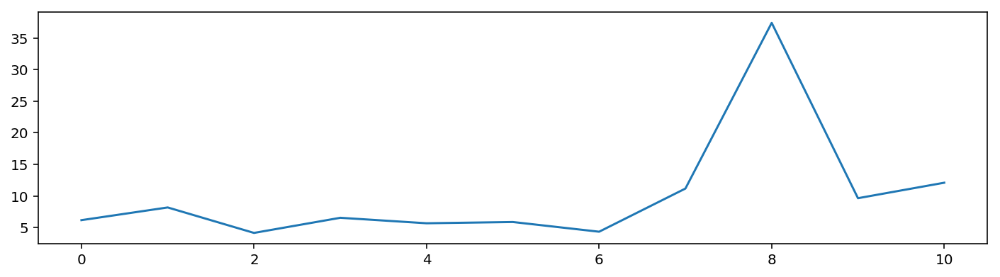

	 	 Test subset results
Test mean absolute percentage error per hour: 3.319411
Test mean absolute percentage error per day: 10.062131 
Test mean absolute error per hour: 0.007707
Test mean absolute error per day: 0.021818 
Test mean absolute error per hour: 0.009694
Test mean absolute error per day: 0.025809 
	 	 Validation Forecasting visualisation


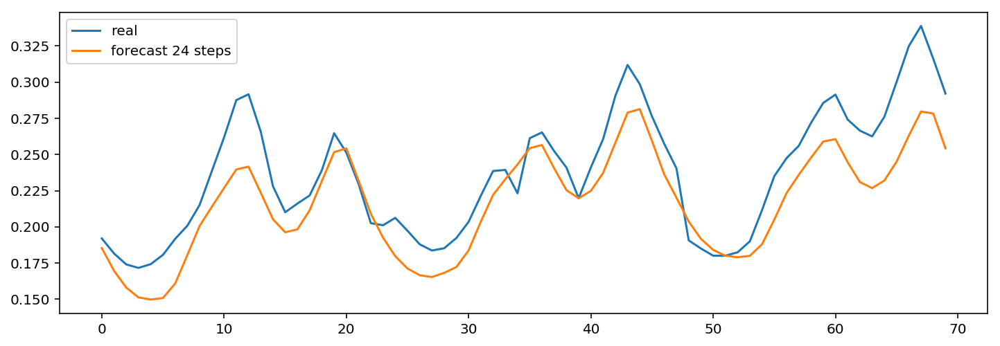

	 	 Forecasting a sample from Learning dataset


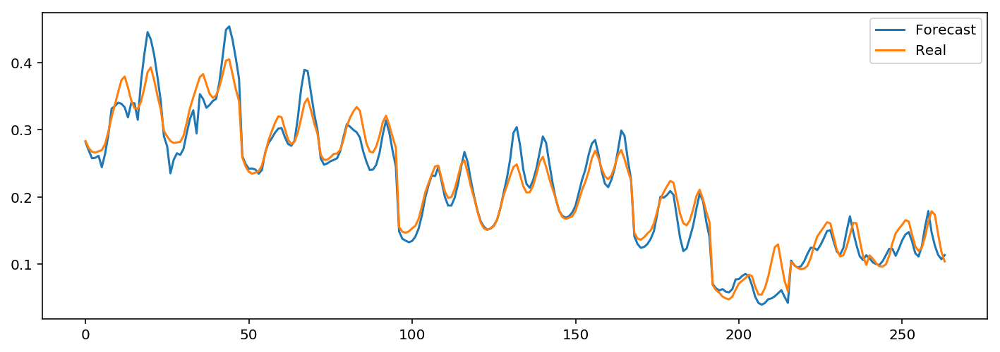

In [32]:
testPeriod= 72
season = 4

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift= False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLR_Model = sm.load(fname='Benchmarks/Models/Global MLR/mlr_5')
# MLP_Model=ModelsList[5]


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLR, LearningHourlyForecast,forecasting_historyMLR  = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLR_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLR.index= range(LearningDailyForecastMLR.index.size)
plt.plot(LearningDailyForecastMLR.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLR.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


	 	 proposed method performance
	 	 learning subset results
Hourly Learning mean absolute percentage error of 264 hours : 2.21662948287 
Daily Learning mean absolute percentage error of 11 days : 3.21455053333 
Hourly Learning mean absolute error of 264 hours : 0.00287741065262 
Daily Learning mean absolute error of 11 days : 0.00512813301788 
Hourly Learning root mean square error of 264 hours : 0.004136098070535358 
Daily Learning root mean square error of 11 days : 0.006391086975293996 
	 	 MAPError plot through Learning DataSet 


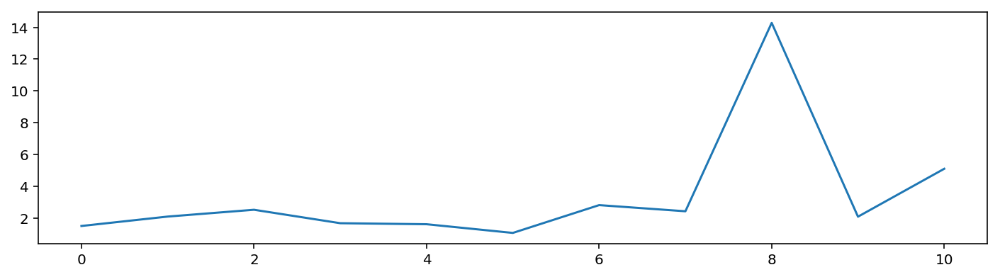

	 	 Test subset results
Test mean absolute percentage error per hour: 3.830407
Test mean absolute percentage error per day: 5.113671 
Test mean absolute error per hour: 0.008705
Test mean absolute error per day: 0.011318 
Test mean absolute error per hour: 0.010292
Test mean absolute error per day: 0.013306 
	 	 Validation Forecasting visualisation


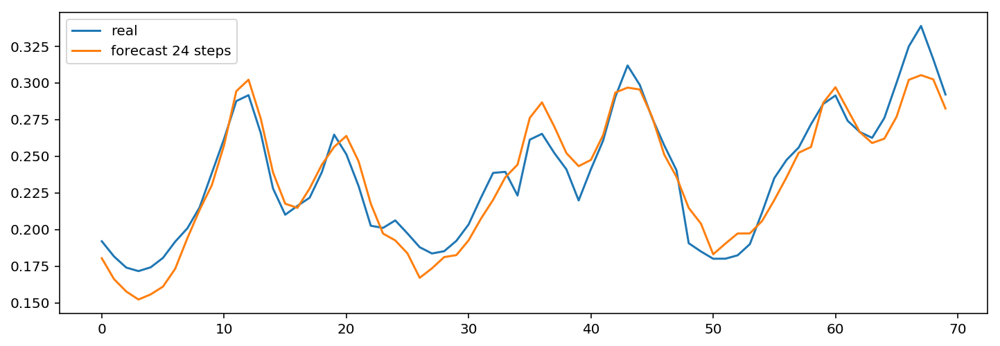

	 	 Forecasting a sample from Learning dataset


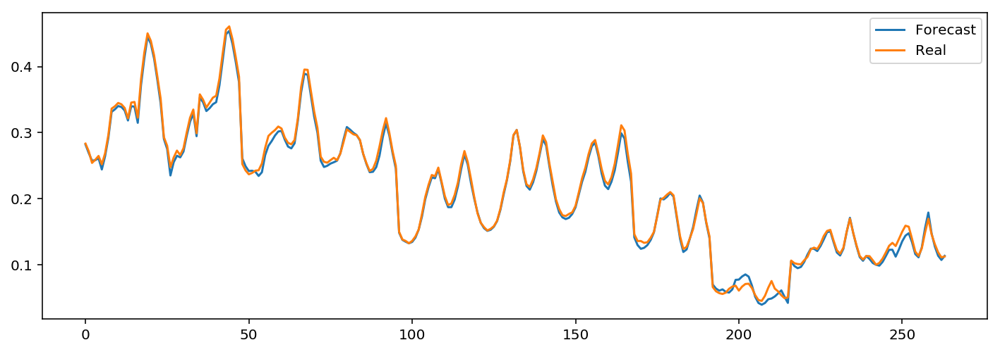

In [33]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = False
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
LSTM_Model = load_model('forecasting depending on Mixture clustering/Models/special days/lstm_56_2018-07-24')

clear_output()
print('==================================================================================')
print('\t \t proposed method performance')
print('==================================================================================')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastProApp, LearningHourlyForecast,forecasting_historyProApp  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,LSTM_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastProApp.index= range(LearningDailyForecastProApp.index.size)
plt.plot(LearningDailyForecastProApp.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastProApp.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 264 hours : 3.141355219 
Daily Learning mean absolute percentage error of 11 days : 6.98123510913 
Hourly Learning mean absolute error of 264 hours : 0.0052439477463 
Daily Learning mean absolute error of 11 days : 0.0119995735371 
Hourly Learning root mean square error of 264 hours : 0.008254192933335534 
Daily Learning root mean square error of 11 days : 0.016499278707785402 
	 	 MAPError plot through Learning DataSet 


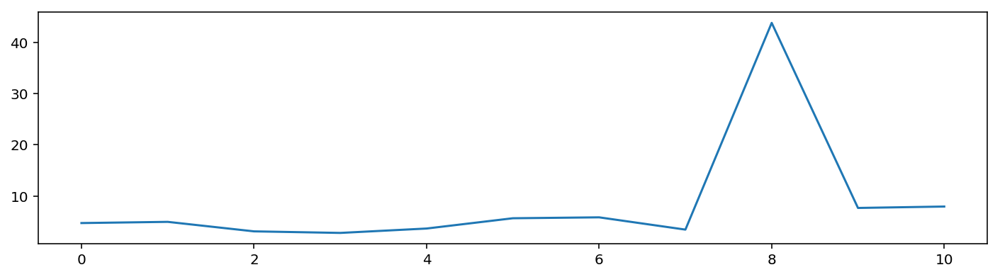

	 	 Test subset results
Test mean absolute percentage error per hour: 2.774094
Test mean absolute percentage error per day: 10.886523 
Test mean absolute error per hour: 0.006188
Test mean absolute error per day: 0.023168 
Test mean absolute error per hour: 0.007865
Test mean absolute error per day: 0.025785 
	 	 Validation Forecasting visualisation


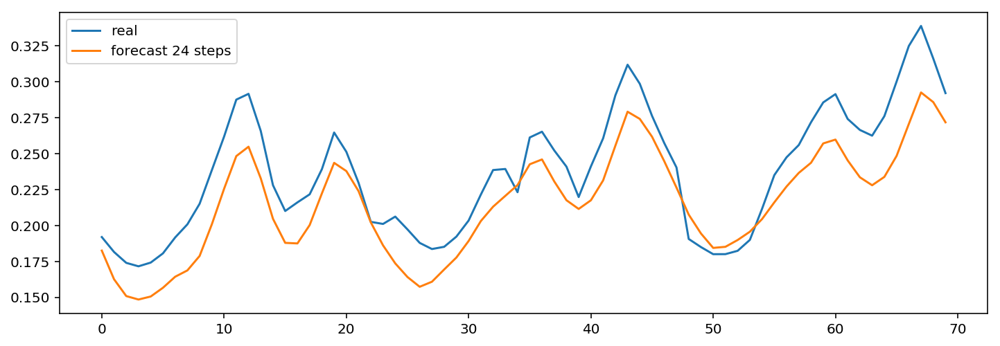

	 	 Forecasting a sample from Learning dataset


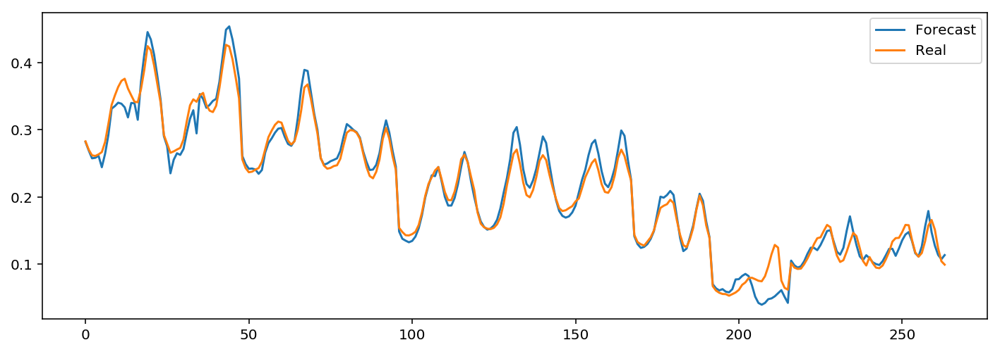

In [34]:
testPeriod= 72
season = 4

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global LSTM/lstm_2')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastLSTM, LearningHourlyForecast, forecasting_historyLSTM  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastLSTM.index= range(LearningDailyForecastLSTM.index.size)
plt.plot(LearningDailyForecastLSTM.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastLSTM.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 264 hours : 3.28605836026 
Daily Learning mean absolute percentage error of 11 days : 7.71215887972 
Hourly Learning mean absolute error of 264 hours : 0.00557311011175 
Daily Learning mean absolute error of 11 days : 0.0138950644691 
Hourly Learning root mean square error of 264 hours : 0.008692953434027203 
Daily Learning root mean square error of 11 days : 0.019471921251977747 
	 	 MAPError plot through Learning DataSet 


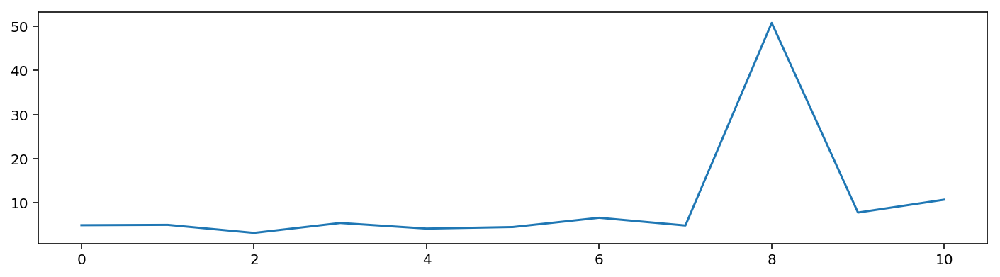

	 	 Test subset results
Test mean absolute percentage error per hour: 2.278372
Test mean absolute percentage error per day: 8.557002 
Test mean absolute error per hour: 0.005329
Test mean absolute error per day: 0.019412 
Test mean absolute error per hour: 0.007133
Test mean absolute error per day: 0.022343 
	 	 Validation Forecasting visualisation


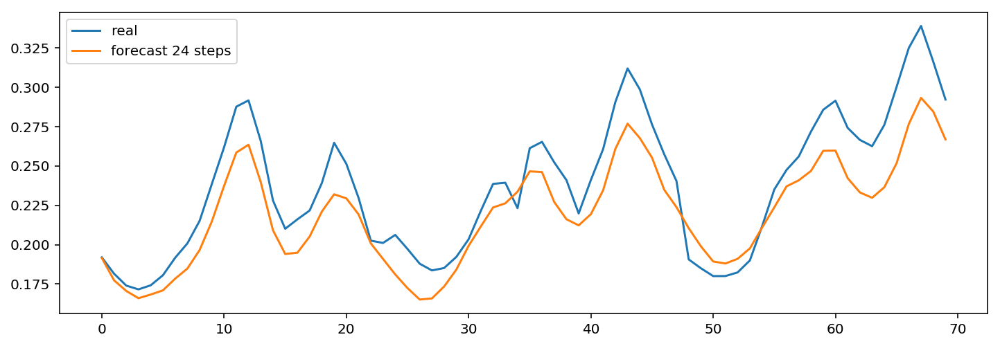

	 	 Forecasting a sample from Learning dataset


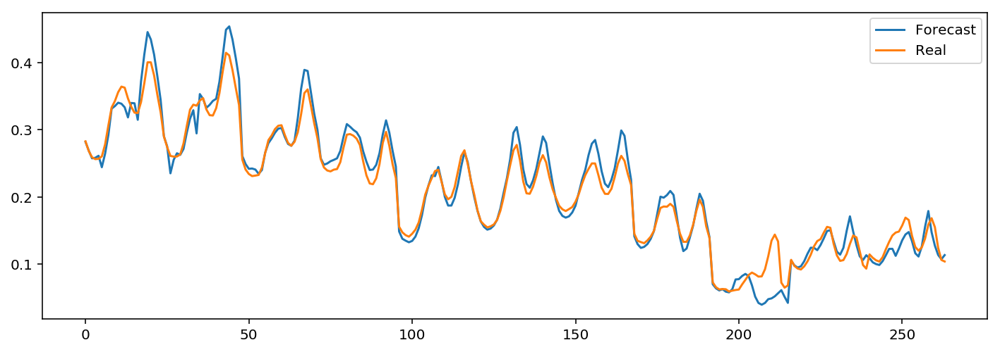

In [35]:
testPeriod= 72
season = 4

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global MLP/mlp_1')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLP, LearningHourlyForecast, forecasting_historyMLP  = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLP.index= range(LearningDailyForecastMLP.index.size)
plt.plot(LearningDailyForecastMLP.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLP.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


	 	 SARIMAX method performance
	 	 Training subset results
Hourly Learning mean absolute percentage error of 264 hours : 10.1801455445 
Daily Learning mean absolute percentage error of 11 days : 11.0309012771 
Hourly Learning mean absolute error of 264 hours : 0.00768265901573 
Daily Learning mean absolute error of 11 days : 0.0194938785048 
Hourly Learning root mean square error of 264 hours : 0.014814131085930519 
Daily Learning root mean square error of 11 days : 0.02721384978796046 
	 	 Test subset results
Test mean absolute percentage error per hour: 3.053261
Test mean absolute percentage error per day: 8.688705 
Test mean absolute error per hour: 0.007140
Test mean absolute error per day: 0.020500 
Test root mean square error per hour: 0.025900
Test root mean square error per day: 0.025900 
	 	 Forecasting samples from Learning dataset


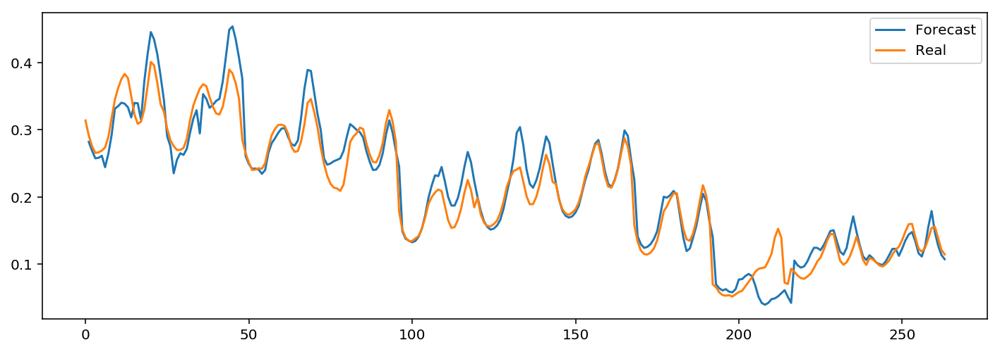

In [36]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])

UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

in1, out1, in2, out2, nbrInputs = prepareInputs2(daydata,season,UsedInputsTemp,testPeriod)

SARIMAX_Model = sm.load('Benchmarks/Models/Global SARIMAX/sarimax_test_8')

LearningDailyForecastSARIMAX = pd.DataFrame(np.random.randn(in1.index.size, 3),index=in1.index,columns=['real', 'forecast','1 step forecast'])
LearningDailyForecastSARIMAX['real']= out1[0].shift(1)

for x in range(0,(in1.index.size/24)):
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= False)




forecasting_historySARIMAX = pd.DataFrame(np.random.randn(in2.index.size, 3),index=in2.index,columns=['real', 'forecast','1 step forecast'])
forecasting_historySARIMAX['real']= out2[0].shift(1)

for x in range(0,(in2.index.size/24)):
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= False)




clear_output()
print('==================================================================================')
print('\t \t SARIMAX method performance')
print('==================================================================================')

print('==================================================================================')
print('\t \t Training subset results')
print('==================================================================================')


HlearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAPE))
print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAPE))

print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAE))
print('Daily Learning mean absolute error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAE))

print('Hourly Learning root mean square error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningRMSE))
print('Daily Learning root mean square error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningRMSE))




HtestMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])
testRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

print('==================================================================================')
print('\t \t Test subset results')
print('==================================================================================')


print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
print('Test mean absolute percentage error per day: %f ' %testMAPE)

print('Test mean absolute error per hour: %f' %HtestMAE)
print('Test mean absolute error per day: %f ' %testMAE)

print('Test root mean square error per hour: %f' %HtestRMSE)
print('Test root mean square error per day: %f ' %testRMSE)

print('==================================================================================')
print('\t \t Forecasting samples from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastSARIMAX.index= range(LearningDailyForecastSARIMAX.index.size)
plt.plot(LearningDailyForecastSARIMAX.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastSARIMAX.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


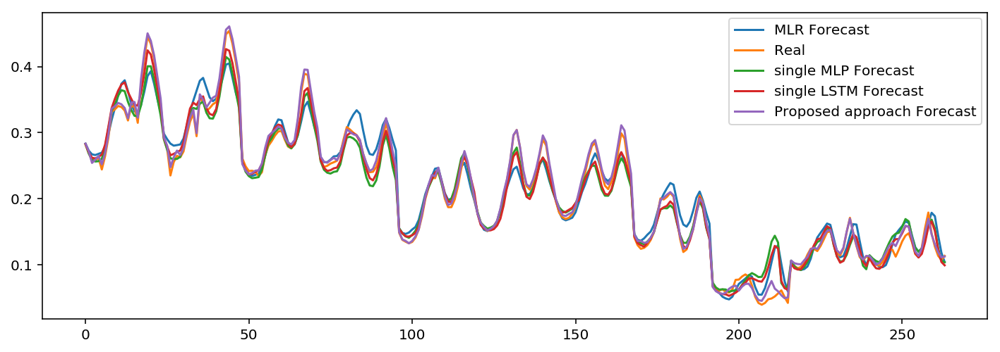

In [37]:
plt.figure(figsize=(12,4))
LearningDailyForecastMLR.index= range(LearningDailyForecastMLR.index.size)
LearningDailyForecastMLP.index= range(LearningDailyForecastMLP.index.size)
LearningDailyForecastLSTM.index= range(LearningDailyForecastLSTM.index.size)
LearningDailyForecastProApp.index= range(LearningDailyForecastProApp.index.size)

plt.plot(LearningDailyForecastMLR.iloc[:,1],label='MLR Forecast')
plt.plot(LearningDailyForecastMLR.iloc[:,0],label='Real')
plt.plot(LearningDailyForecastMLP.iloc[:,1],label='single MLP Forecast')
plt.plot(LearningDailyForecastLSTM.iloc[:,1],label='single LSTM Forecast')
plt.plot(LearningDailyForecastProApp.iloc[:,1],label='Proposed approach Forecast')

plt.legend( loc=1, borderaxespad=0.4)
plt.show()


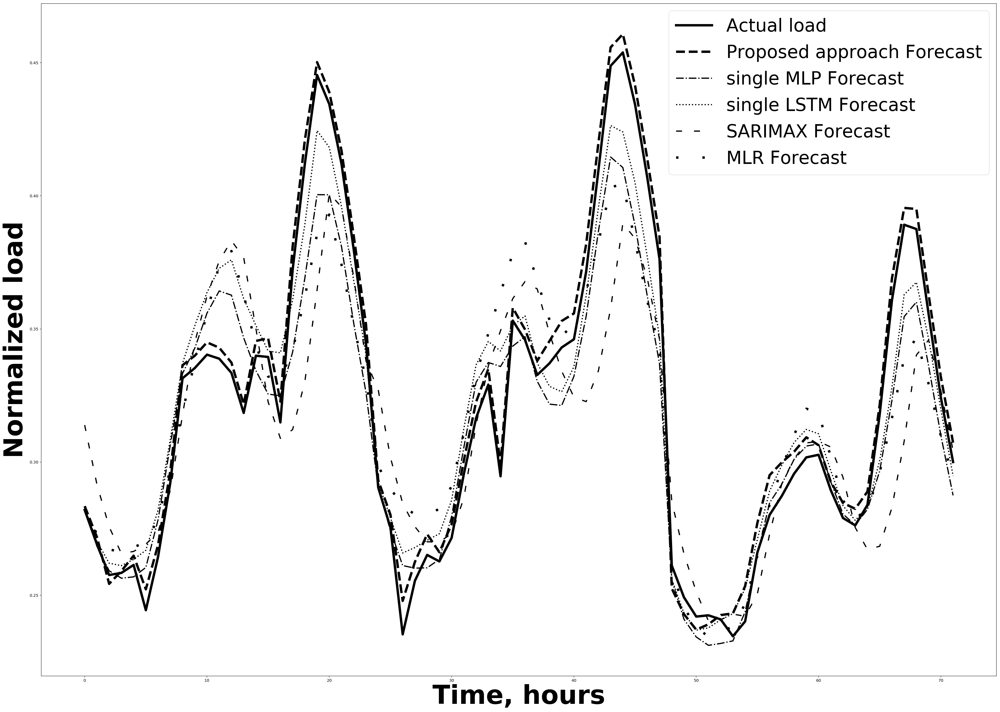

In [47]:
LearningDailyForecastProApp.iloc[:72,0].plot(label='Actual load',c='black',marker='.',linestyle='-',linewidth=6,figsize=(35,25))
LearningDailyForecastProApp.iloc[:72,1].plot(label='Proposed approach Forecast',c='black',linewidth=6,linestyle='--')
LearningDailyForecastMLP.iloc[:72,1].plot(label='single MLP Forecast',c='black',linewidth=3,linestyle='-.')
LearningDailyForecastLSTM.iloc[:72,1].plot(label='single LSTM Forecast',c='black',linewidth=3,linestyle=':')
LearningDailyForecastSARIMAX.iloc[:72,1].plot(label='SARIMAX Forecast',c='black',linewidth=3,linestyle=(0, (5, 10)))
LearningDailyForecastMLR.iloc[:72,1].plot(label='MLR Forecast',c='black',linewidth=6,linestyle= (0, (1, 10)))
plt.legend( fontsize= 45,loc='best', borderaxespad=0.4)
plt.ylabel('Normalized load',fontsize=65,weight='bold')
plt.xlabel('Time, hours',fontsize=65,weight='bold')
plt.tight_layout()
plt.savefig('SpecialDaysForcastComparison.pdf')

plt.show()


	 	 proposed method performance
	 	 learning subset results
Hourly Learning mean absolute percentage error of 552 hours : 3.32096719059 
Daily Learning mean absolute percentage error of 23 days : 5.02037560882 
Hourly Learning mean absolute error of 552 hours : 0.00250660166555 
Daily Learning mean absolute error of 23 days : 0.00401019450283 
Hourly Learning root mean square error of 552 hours : 0.003670075731241359 
Daily Learning root mean square error of 23 days : 0.005910655262971577 
	 	 MAPError plot through Learning DataSet 


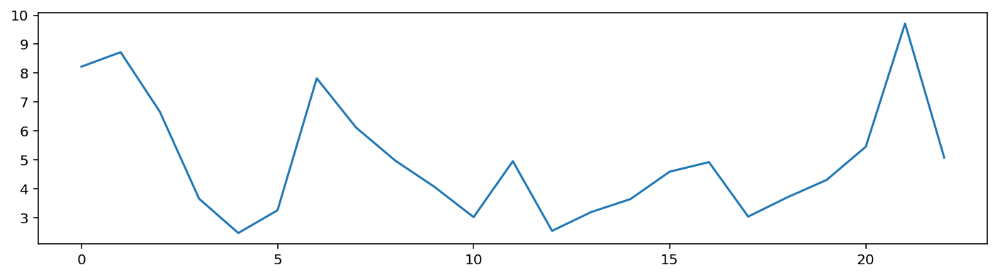

	 	 Test subset results
Test mean absolute percentage error per hour: 2.556675
Test mean absolute percentage error per day: 4.409836 
Test mean absolute error per hour: 0.001834
Test mean absolute error per day: 0.003545 
Test mean absolute error per hour: 0.002583
Test mean absolute error per day: 0.004545 
	 	 Validation Forecasting visualisation


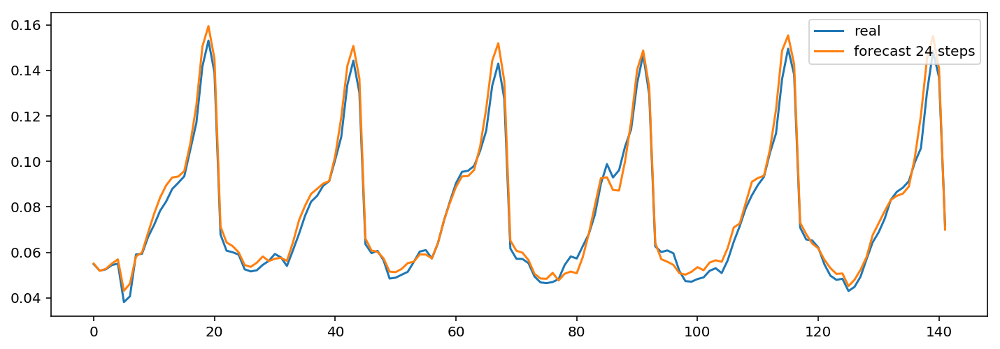

	 	 Forecasting a sample from Learning dataset


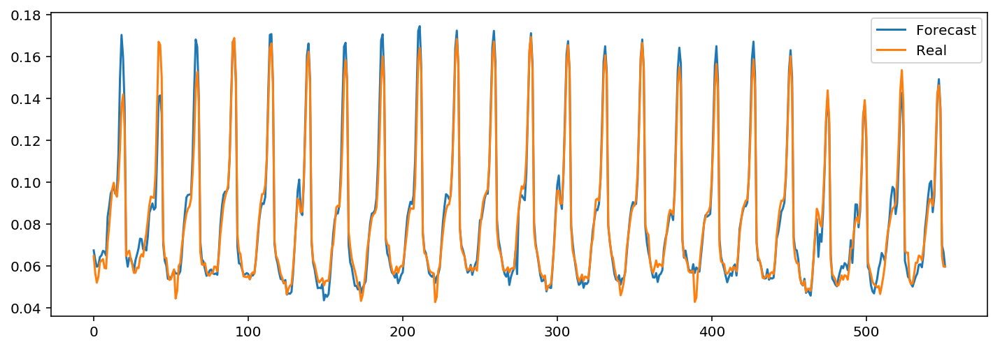

In [48]:
testPeriod= 144
season = 3


UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors

LSTM_Model = load_model('forecasting depending on Mixture clustering/Models/ramadan/lstm_47_2018-07-22')

clear_output()
print('==================================================================================')
print('\t \t proposed method performance')
print('==================================================================================')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastProApp, LearningHourlyForecast,forecasting_historyProApp  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,LSTM_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastProApp.index= range(LearningDailyForecastProApp.index.size)
plt.plot(LearningDailyForecastProApp.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastProApp.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 552 hours : 3.72210527235 
Daily Learning mean absolute percentage error of 23 days : 8.79748591424 
Hourly Learning mean absolute error of 552 hours : 0.00289075433276 
Daily Learning mean absolute error of 23 days : 0.00753211022084 
Hourly Learning root mean square error of 552 hours : 0.004070776662284052 
Daily Learning root mean square error of 23 days : 0.010941579594774048 
	 	 MAPError plot through Learning DataSet 


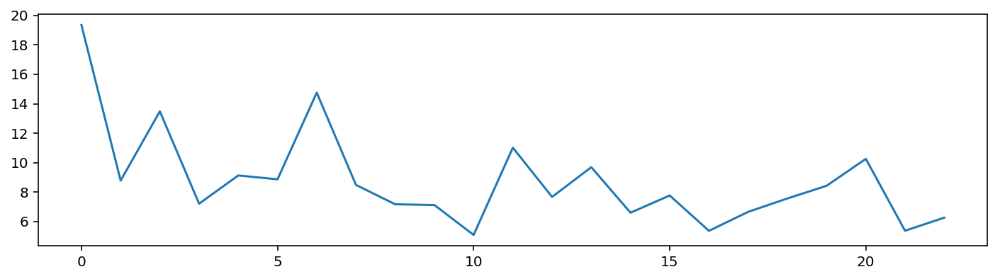

	 	 Test subset results
Test mean absolute percentage error per hour: 4.571984
Test mean absolute percentage error per day: 7.777289 
Test mean absolute error per hour: 0.003558
Test mean absolute error per day: 0.005721 
Test mean absolute error per hour: 0.004945
Test mean absolute error per day: 0.007138 
	 	 Validation Forecasting visualisation


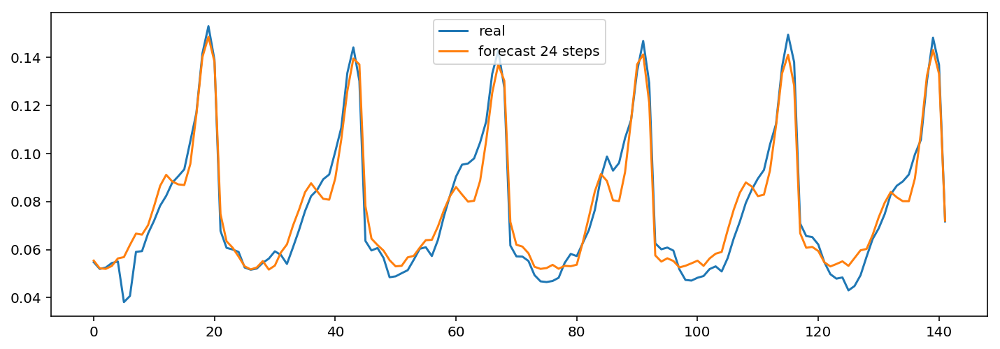

	 	 Forecasting a sample from Learning dataset


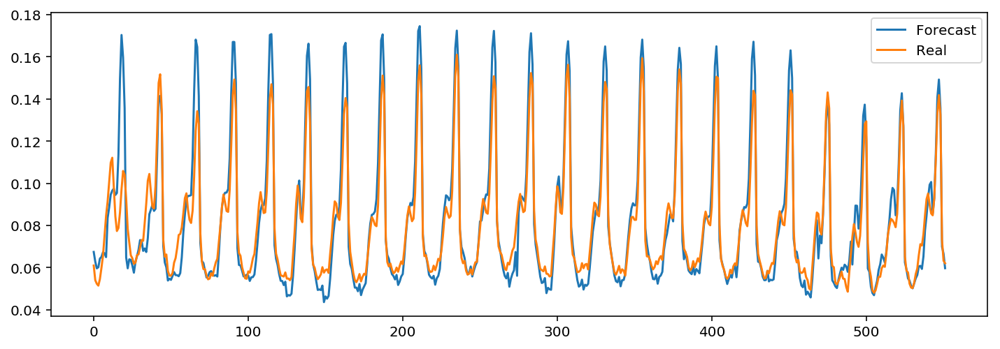

In [49]:
testPeriod= 144
season = 3

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global MLP/mlp_1')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLP, LearningHourlyForecast, forecasting_historyMLP = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLP.index= range(LearningDailyForecastMLP.index.size)
plt.plot(LearningDailyForecastMLP.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLP.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 552 hours : 3.65612461517 
Daily Learning mean absolute percentage error of 23 days : 8.11224252673 
Hourly Learning mean absolute error of 552 hours : 0.00283058747894 
Daily Learning mean absolute error of 23 days : 0.00683319181641 
Hourly Learning root mean square error of 552 hours : 0.003997511883333752 
Daily Learning root mean square error of 23 days : 0.01046211491528442 
	 	 MAPError plot through Learning DataSet 


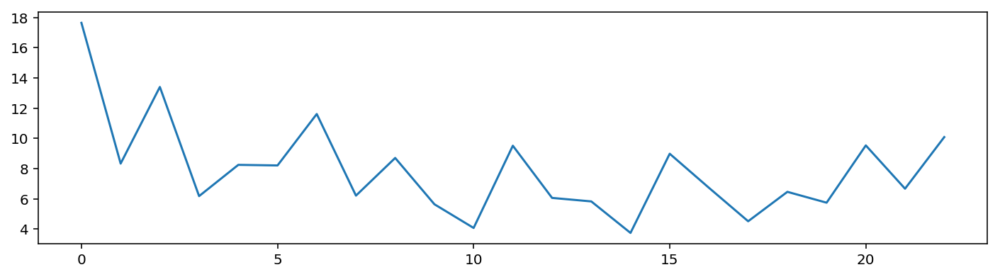

	 	 Test subset results
Test mean absolute percentage error per hour: 4.536960
Test mean absolute percentage error per day: 7.480048 
Test mean absolute error per hour: 0.003482
Test mean absolute error per day: 0.005617 
Test mean absolute error per hour: 0.004779
Test mean absolute error per day: 0.007126 
	 	 Validation Forecasting visualisation


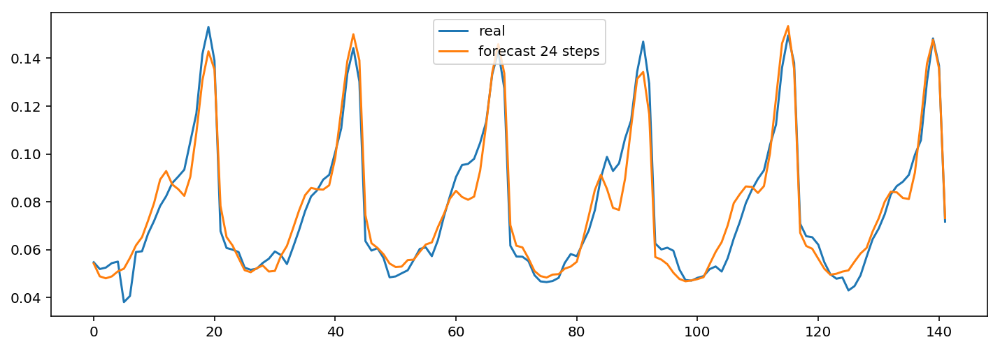

	 	 Forecasting a sample from Learning dataset


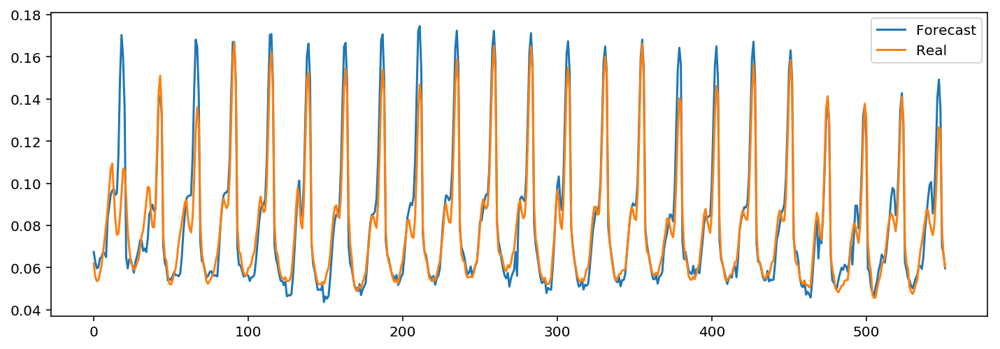

In [50]:
testPeriod= 144
season = 3

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global LSTM/lstm_2')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastLSTM, LearningHourlyForecast, forecasting_historyLSTM  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastLSTM.index= range(LearningDailyForecastLSTM.index.size)
plt.plot(LearningDailyForecastLSTM.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastLSTM.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 552 hours : 11.8017367622 
Daily Learning mean absolute percentage error of 23 days : 19.207413187 
Hourly Learning mean absolute error of 552 hours : 0.00827429007093 
Daily Learning mean absolute error of 23 days : 0.0155114230309 
Hourly Learning root mean square error of 552 hours : 0.012198761998896463 
Daily Learning root mean square error of 23 days : 0.020862207457076617 
	 	 MAPError plot through Learning DataSet 


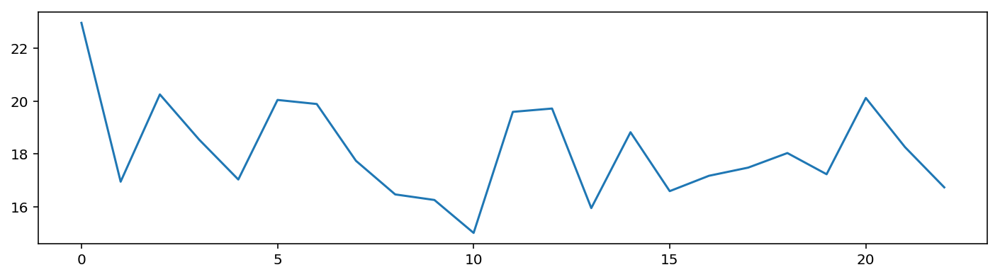

	 	 Test subset results
Test mean absolute percentage error per hour: 11.154727
Test mean absolute percentage error per day: 23.302154 
Test mean absolute error per hour: 0.007251
Test mean absolute error per day: 0.015514 
Test mean absolute error per hour: 0.010805
Test mean absolute error per day: 0.018938 
	 	 Validation Forecasting visualisation


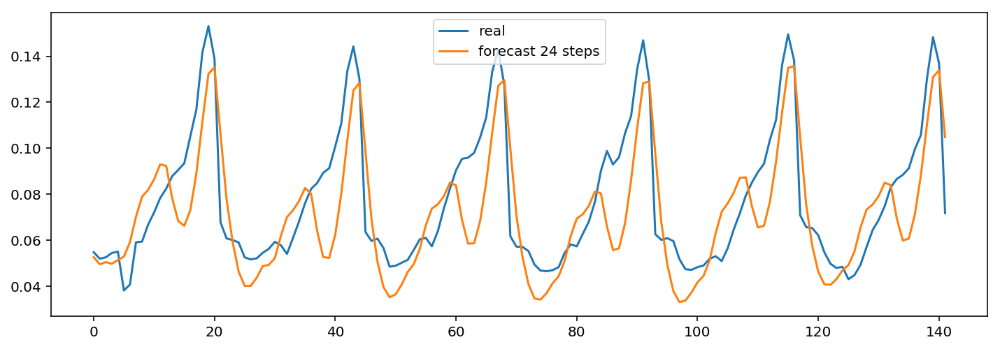

	 	 Forecasting a sample from Learning dataset


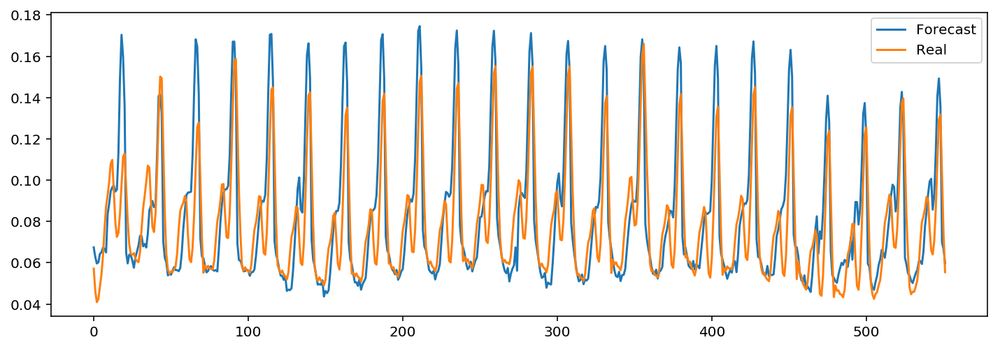

In [51]:
testPeriod= 144
season = 3

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLR_Model = sm.load(fname='Benchmarks/Models/Global MLR/mlr_5')
# MLP_Model=ModelsList[5]


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLR, LearningHourlyForecast, forecasting_historyMLR = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLR_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLR.index= range(LearningDailyForecastMLR.index.size)
plt.plot(LearningDailyForecastMLR.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLR.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()


	 	 SARIMAX method performance
	 	 Training subset results
Hourly Learning mean absolute percentage error of 552 hours : 4.80075723758 
Daily Learning mean absolute percentage error of 23 days : 10.3866472046 
Hourly Learning mean absolute error of 552 hours : 0.00379988491362 
Daily Learning mean absolute error of 23 days : 0.00856704374181 
Hourly Learning root mean square error of 552 hours : 0.0067144507584295954 
Daily Learning root mean square error of 23 days : 0.012787932071367478 
	 	 Test subset results
Test mean absolute percentage error per hour: 3.992809
Test mean absolute percentage error per day: 11.130192 
Test mean absolute error per hour: 0.002762
Test mean absolute error per day: 0.007403 
Test root mean square error per hour: 0.009017
Test root mean square error per day: 0.009017 
	 	 Forecasting samples from Learning dataset


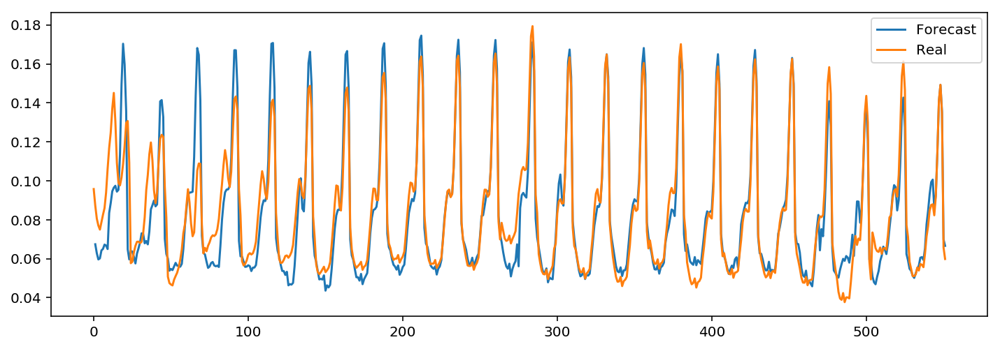

In [52]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])

UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

in1, out1, in2, out2, nbrInputs = prepareInputs2(daydata,season,UsedInputsTemp,testPeriod)

SARIMAX_Model = sm.load('Benchmarks/Models/Global SARIMAX/sarimax_test_8')

LearningDailyForecastSARIMAX = pd.DataFrame(np.random.randn(in1.index.size, 3),index=in1.index,columns=['real', 'forecast','1 step forecast'])
LearningDailyForecastSARIMAX['real']= out1[0].shift(1)

for x in range(0,(in1.index.size/24)):
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= False)




forecasting_historySARIMAX = pd.DataFrame(np.random.randn(in2.index.size, 3),index=in2.index,columns=['real', 'forecast','1 step forecast'])
forecasting_historySARIMAX['real']= out2[0].shift(1)

for x in range(0,(in2.index.size/24)):
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= False)




clear_output()
print('==================================================================================')
print('\t \t SARIMAX method performance')
print('==================================================================================')

print('==================================================================================')
print('\t \t Training subset results')
print('==================================================================================')


HlearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAPE))
print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAPE))

print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAE))
print('Daily Learning mean absolute error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAE))

print('Hourly Learning root mean square error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningRMSE))
print('Daily Learning root mean square error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningRMSE))




HtestMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])
testRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

print('==================================================================================')
print('\t \t Test subset results')
print('==================================================================================')


print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
print('Test mean absolute percentage error per day: %f ' %testMAPE)

print('Test mean absolute error per hour: %f' %HtestMAE)
print('Test mean absolute error per day: %f ' %testMAE)

print('Test root mean square error per hour: %f' %HtestRMSE)
print('Test root mean square error per day: %f ' %testRMSE)

print('==================================================================================')
print('\t \t Forecasting samples from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastSARIMAX.index= range(LearningDailyForecastSARIMAX.index.size)
plt.plot(LearningDailyForecastSARIMAX.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastSARIMAX.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()



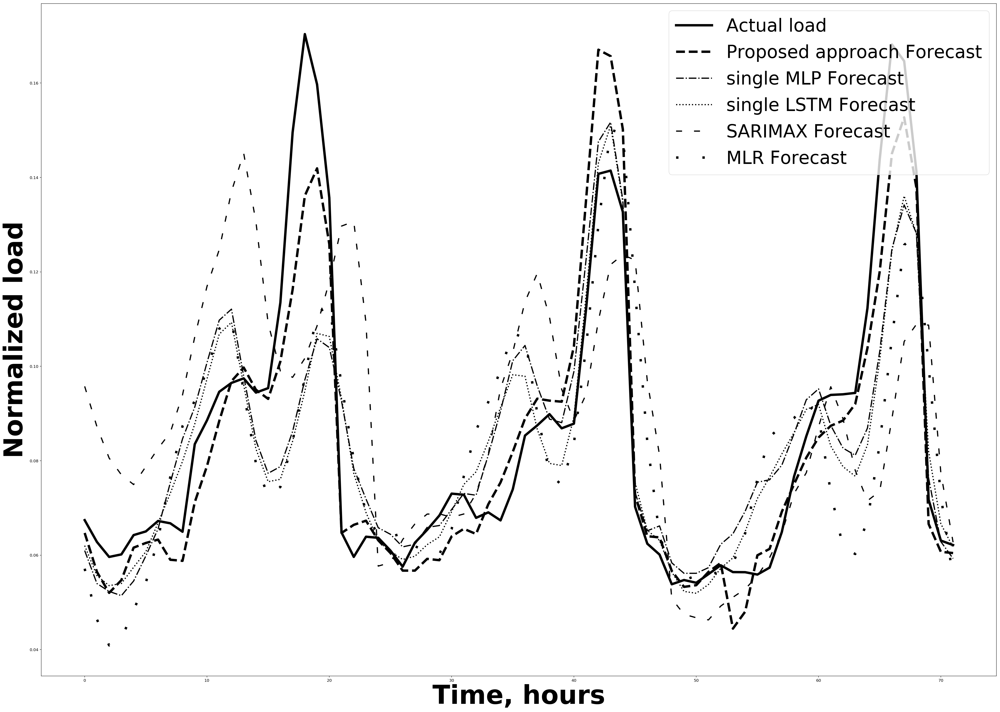

In [53]:
LearningDailyForecastProApp.iloc[:72,0].plot(label='Actual load',c='black',marker='.',linestyle='-',linewidth=6,figsize=(35,25))
LearningDailyForecastProApp.iloc[:72,1].plot(label='Proposed approach Forecast',c='black',linewidth=6,linestyle='--')
LearningDailyForecastMLP.iloc[:72,1].plot(label='single MLP Forecast',c='black',linewidth=3,linestyle='-.')
LearningDailyForecastLSTM.iloc[:72,1].plot(label='single LSTM Forecast',c='black',linewidth=3,linestyle=':')
LearningDailyForecastSARIMAX.iloc[:72,1].plot(label='SARIMAX Forecast',c='black',linewidth=3,linestyle=(0, (5, 10)))
LearningDailyForecastMLR.iloc[:72,1].plot(label='MLR Forecast',c='black',linewidth=6,linestyle= (0, (1, 10)))
plt.legend( fontsize= 45,loc='best', borderaxespad=0.4)
plt.ylabel('Normalized load',fontsize=65,weight='bold')
plt.xlabel('Time, hours',fontsize=65,weight='bold')

plt.tight_layout()
plt.savefig('RamadanComparison.pdf')

plt.show()


	 	 proposed method performance
	 	 learning subset results
Hourly Learning mean absolute percentage error of 1872 hours : 1.16620788059 
Daily Learning mean absolute percentage error of 78 days : 3.5265676799 
Hourly Learning mean absolute error of 1872 hours : 0.00401083298959 
Daily Learning mean absolute error of 78 days : 0.0119833018796 
Hourly Learning root mean square error of 1872 hours : 0.0060569462303816405 
Daily Learning root mean square error of 78 days : 0.01574271752640826 
	 	 MAPError plot through Learning DataSet 


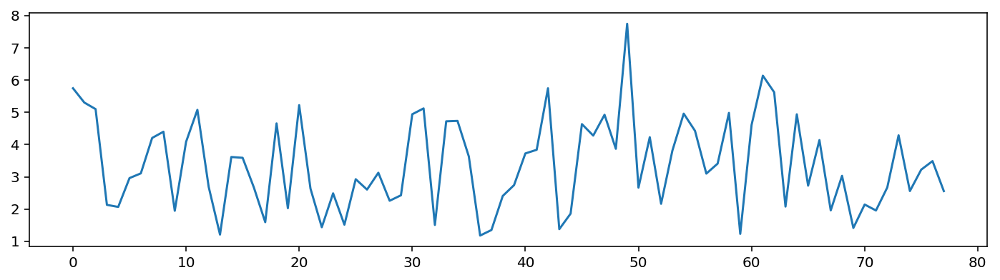

	 	 Test subset results
Test mean absolute percentage error per hour: 1.324619
Test mean absolute percentage error per day: 3.622896 
Test mean absolute error per hour: 0.004550
Test mean absolute error per day: 0.012566 
Test mean absolute error per hour: 0.006025
Test mean absolute error per day: 0.015863 
	 	 Validation Forecasting visualisation


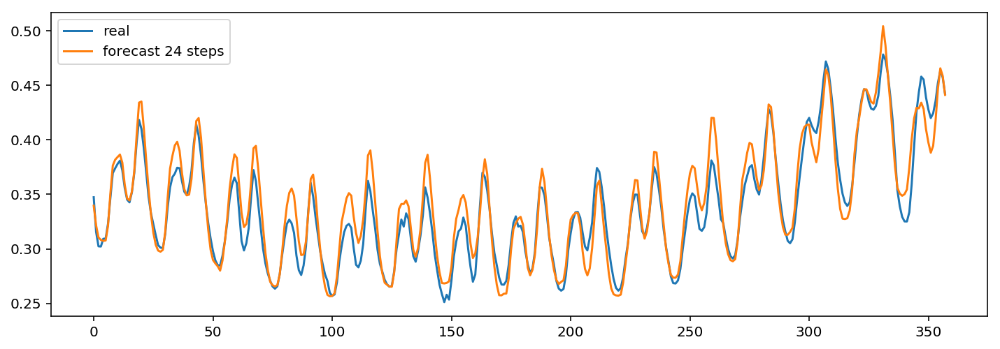

	 	 Forecasting a sample from Learning dataset


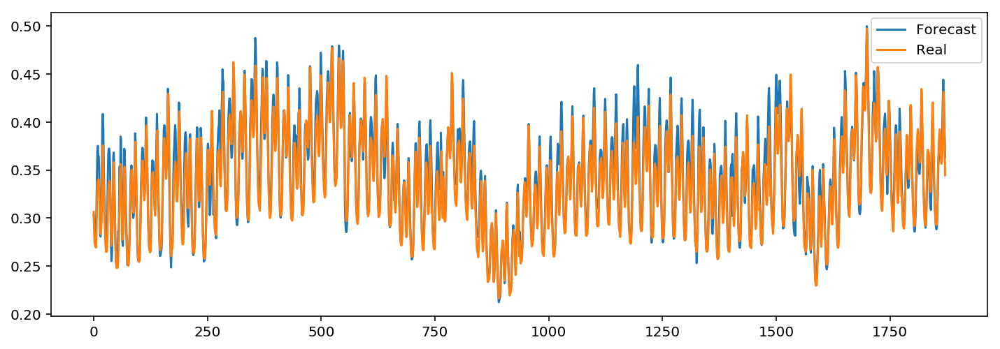

In [78]:
testPeriod= 360
season = 0


UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors

LSTM_Model = load_model('forecasting depending on Mixture clustering/Models/winter/lstm_43_2018-07-22')

clear_output()
print('==================================================================================')
print('\t \t proposed method performance')
print('==================================================================================')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastProApp, LearningHourlyForecast,forecasting_historyProApp  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,LSTM_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastProApp.index= range(LearningDailyForecastProApp.index.size)
plt.plot(LearningDailyForecastProApp.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastProApp.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()



-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 1872 hours : 1.30765223029 
Daily Learning mean absolute percentage error of 78 days : 3.97061103251 
Hourly Learning mean absolute error of 1872 hours : 0.00452333881369 
Daily Learning mean absolute error of 78 days : 0.01339980151 
Hourly Learning root mean square error of 1872 hours : 0.006640801420922779 
Daily Learning root mean square error of 78 days : 0.017546068139248014 
	 	 MAPError plot through Learning DataSet 


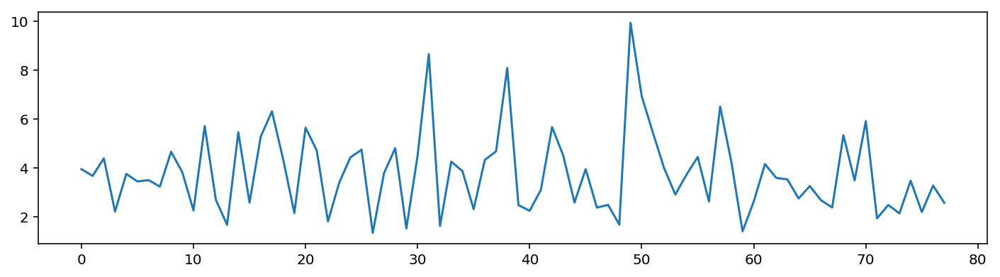

	 	 Test subset results
Test mean absolute percentage error per hour: 1.367348
Test mean absolute percentage error per day: 5.366070 
Test mean absolute error per hour: 0.004680
Test mean absolute error per day: 0.018747 
Test mean absolute error per hour: 0.005965
Test mean absolute error per day: 0.022371 
	 	 Validation Forecasting visualisation


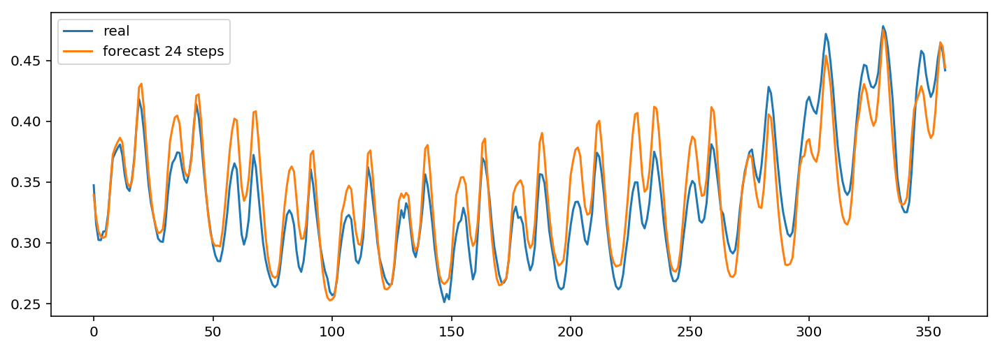

	 	 Forecasting a sample from Learning dataset


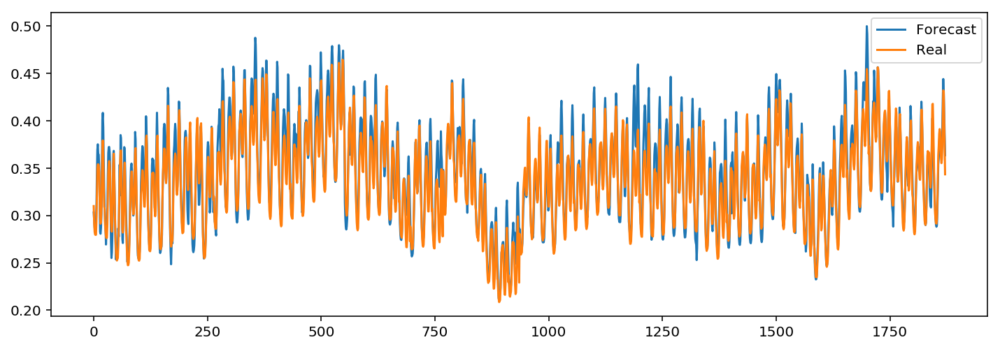

In [79]:

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global MLP/mlp_1')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLP, LearningHourlyForecast, forecasting_historyMLP = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLP.index= range(LearningDailyForecastMLP.index.size)
plt.plot(LearningDailyForecastMLP.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLP.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()



-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 1872 hours : 1.25240710735 
Daily Learning mean absolute percentage error of 78 days : 3.25923026468 
Hourly Learning mean absolute error of 1872 hours : 0.00431046570623 
Daily Learning mean absolute error of 78 days : 0.0112584610469 
Hourly Learning root mean square error of 1872 hours : 0.006386580834074458 
Daily Learning root mean square error of 78 days : 0.014913865185800604 
	 	 MAPError plot through Learning DataSet 


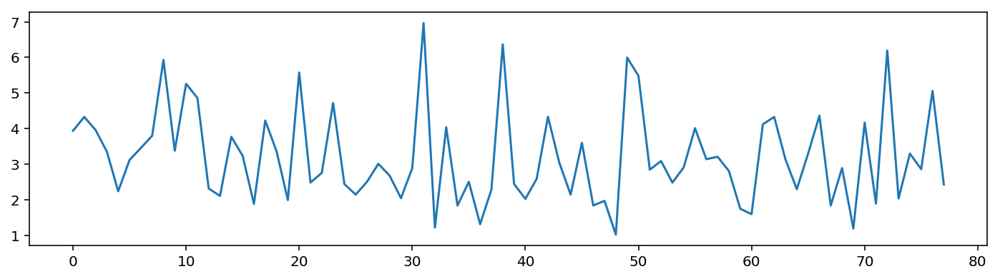

	 	 Test subset results
Test mean absolute percentage error per hour: 1.429400
Test mean absolute percentage error per day: 5.490870 
Test mean absolute error per hour: 0.004882
Test mean absolute error per day: 0.019259 
Test mean absolute error per hour: 0.006132
Test mean absolute error per day: 0.022780 
	 	 Validation Forecasting visualisation


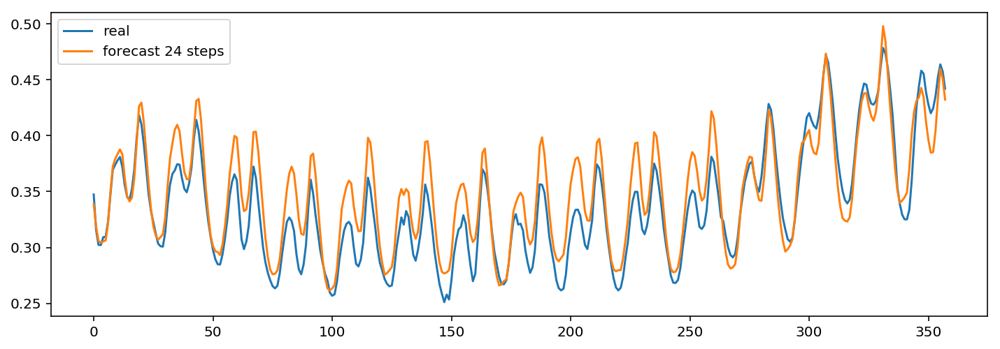

	 	 Forecasting a sample from Learning dataset


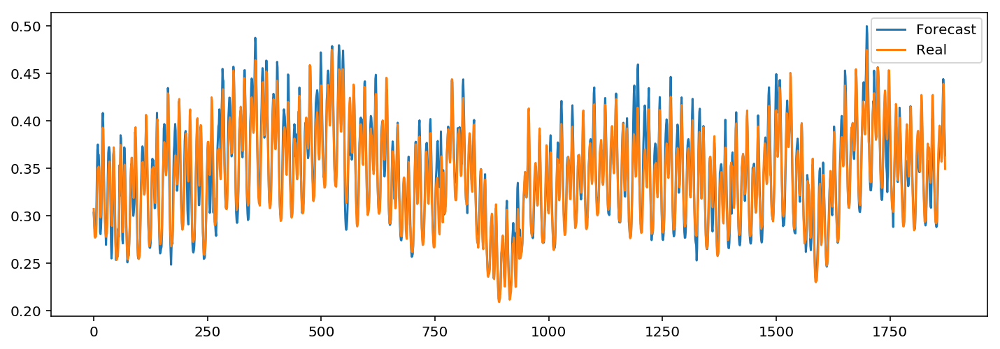

In [80]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global LSTM/lstm_2')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastLSTM, LearningHourlyForecast, forecasting_historyLSTM  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastLSTM.index= range(LearningDailyForecastLSTM.index.size)
plt.plot(LearningDailyForecastLSTM.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastLSTM.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()



-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 1872 hours : 1.70831984601 
Daily Learning mean absolute percentage error of 78 days : 4.69038522246 
Hourly Learning mean absolute error of 1872 hours : 0.00592855731558 
Daily Learning mean absolute error of 78 days : 0.0160955798805 
Hourly Learning root mean square error of 1872 hours : 0.008364395425716936 
Daily Learning root mean square error of 78 days : 0.021238849221422575 
	 	 MAPError plot through Learning DataSet 


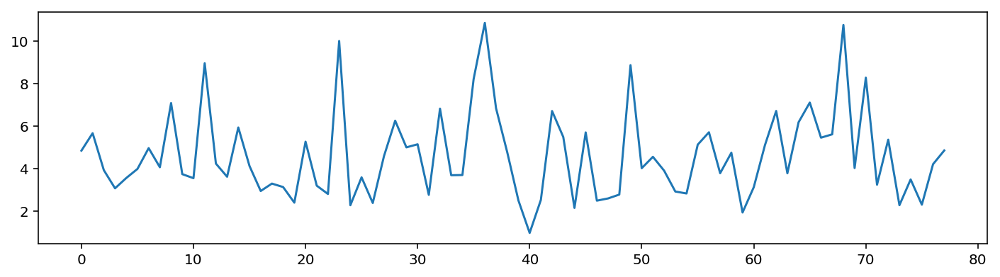

	 	 Test subset results
Test mean absolute percentage error per hour: 1.321987
Test mean absolute percentage error per day: 4.481987 
Test mean absolute error per hour: 0.004505
Test mean absolute error per day: 0.015350 
Test mean absolute error per hour: 0.005863
Test mean absolute error per day: 0.019354 
	 	 Validation Forecasting visualisation


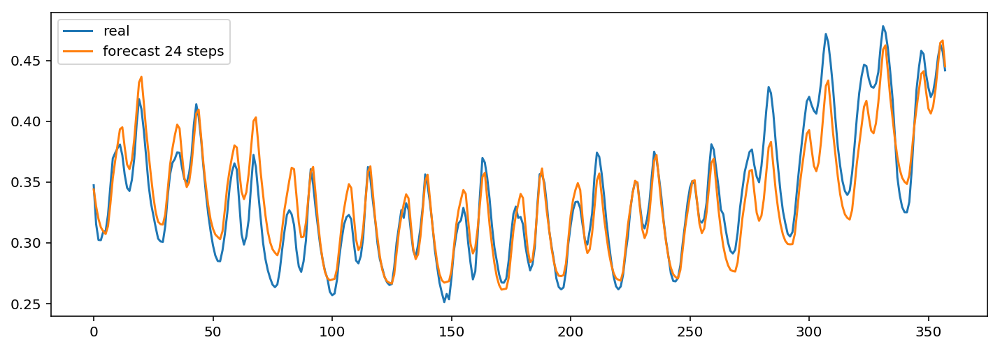

	 	 Forecasting a sample from Learning dataset


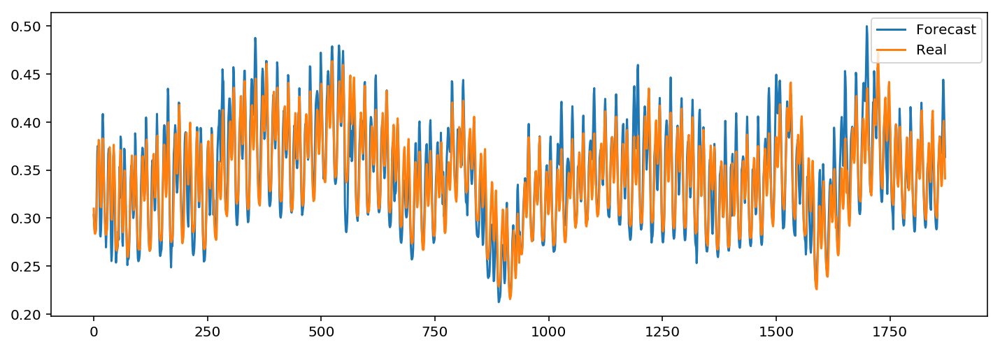

In [54]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLR_Model = sm.load(fname='Benchmarks/Models/Global MLR/mlr_5')
# MLP_Model=ModelsList[5]


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLR, LearningHourlyForecast, forecasting_historyMLR = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLR_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLR.index= range(LearningDailyForecastMLR.index.size)
plt.plot(LearningDailyForecastMLR.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLR.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()



	 	 SARIMAX method performance
	 	 Training subset results
Hourly Learning mean absolute percentage error of 1872 hours : 1.41846379981 
Daily Learning mean absolute percentage error of 78 days : 4.33937498286 
Hourly Learning mean absolute error of 1872 hours : 0.00492091521431 
Daily Learning mean absolute error of 78 days : 0.0151328125734 
Hourly Learning root mean square error of 1872 hours : 0.007835022731663983 
Daily Learning root mean square error of 78 days : 0.02021919991899594 
	 	 Test subset results
Test mean absolute percentage error per hour: 0.972344
Test mean absolute percentage error per day: 3.398098 
Test mean absolute error per hour: 0.003270
Test mean absolute error per day: 0.011543 
Test root mean square error per hour: 0.015691
Test root mean square error per day: 0.015691 
	 	 Forecasting samples from Learning dataset


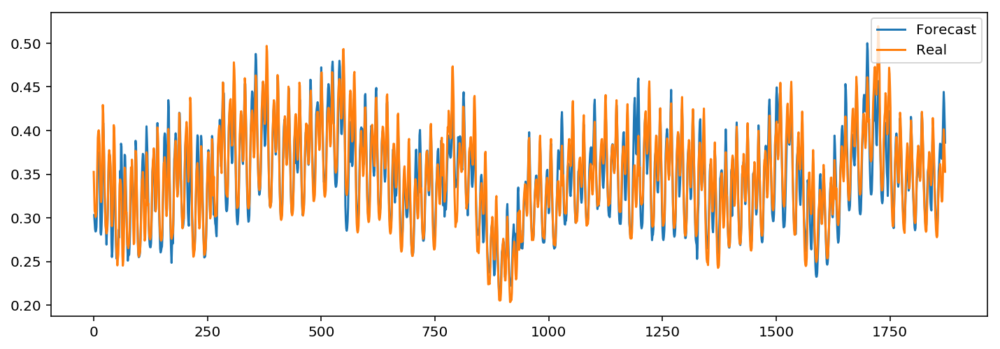

In [55]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])

UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

in1, out1, in2, out2, nbrInputs = prepareInputs2(daydata,season,UsedInputsTemp,testPeriod)

SARIMAX_Model = sm.load('Benchmarks/Models/Global SARIMAX/sarimax_test_8')

LearningDailyForecastSARIMAX = pd.DataFrame(np.random.randn(in1.index.size, 3),index=in1.index,columns=['real', 'forecast','1 step forecast'])
LearningDailyForecastSARIMAX['real']= out1[0].shift(1)

for x in range(0,(in1.index.size/24)):
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= False)




forecasting_historySARIMAX = pd.DataFrame(np.random.randn(in2.index.size, 3),index=in2.index,columns=['real', 'forecast','1 step forecast'])
forecasting_historySARIMAX['real']= out2[0].shift(1)

for x in range(0,(in2.index.size/24)):
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= False)




clear_output()
print('==================================================================================')
print('\t \t SARIMAX method performance')
print('==================================================================================')

print('==================================================================================')
print('\t \t Training subset results')
print('==================================================================================')


HlearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAPE))
print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAPE))

print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAE))
print('Daily Learning mean absolute error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAE))

print('Hourly Learning root mean square error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningRMSE))
print('Daily Learning root mean square error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningRMSE))




HtestMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])
testRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

print('==================================================================================')
print('\t \t Test subset results')
print('==================================================================================')


print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
print('Test mean absolute percentage error per day: %f ' %testMAPE)

print('Test mean absolute error per hour: %f' %HtestMAE)
print('Test mean absolute error per day: %f ' %testMAE)

print('Test root mean square error per hour: %f' %HtestRMSE)
print('Test root mean square error per day: %f ' %testRMSE)

print('==================================================================================')
print('\t \t Forecasting samples from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastSARIMAX.index= range(LearningDailyForecastSARIMAX.index.size)
plt.plot(LearningDailyForecastSARIMAX.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastSARIMAX.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()




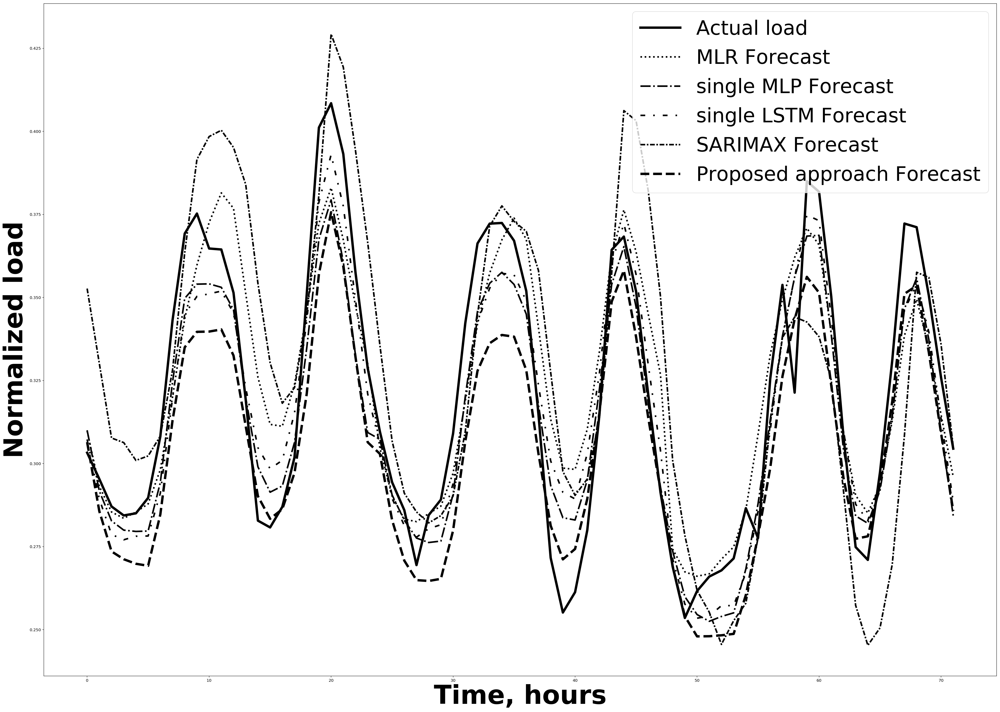

In [57]:
LearningDailyForecastProApp.iloc[:72,0].plot(label='Actual load',c='black',marker='.',linestyle='-',linewidth=6,figsize=(35,25))
LearningDailyForecastMLR.iloc[:72,1].plot(label='MLR Forecast',c='black',linewidth=4,linestyle=':')
LearningDailyForecastMLP.iloc[:72,1].plot(label='single MLP Forecast',c='black',linewidth=4,linestyle='-.')
LearningDailyForecastLSTM.iloc[:72,1].plot(label='single LSTM Forecast',c='black',linewidth=4,linestyle=(0, (3, 5, 1, 5)))
LearningDailyForecastSARIMAX.iloc[:72,1].plot(label='SARIMAX Forecast',c='black',linewidth=4,linestyle=(0, (3, 1, 1, 1)))
LearningDailyForecastProApp.iloc[:72,1].plot(label='Proposed approach Forecast',c='black',linewidth=6,linestyle='--')
plt.legend( fontsize= 50,loc='best', borderaxespad=0.4)
plt.ylabel('Normalized load',fontsize=65,weight='bold')
plt.xlabel('Time, hours',fontsize=65,weight='bold')

plt.tight_layout()
plt.savefig('WinterComparison.pdf')

plt.show()



	 	 proposed method performance
	 	 learning subset results
Hourly Learning mean absolute percentage error of 816 hours : 1.65165695288 
Daily Learning mean absolute percentage error of 34 days : 3.97324251088 
Hourly Learning mean absolute error of 816 hours : 0.00346375872804 
Daily Learning mean absolute error of 34 days : 0.00867844251596 
Hourly Learning root mean square error of 816 hours : 0.004817769267681187 
Daily Learning root mean square error of 34 days : 0.01134852342084435 
	 	 MAPError plot through Learning DataSet 


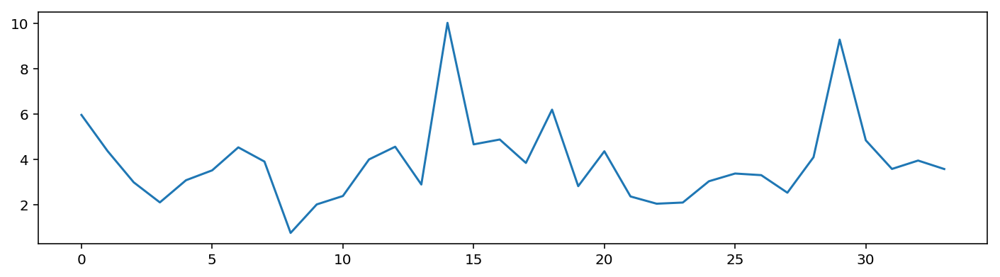

	 	 Test subset results
Test mean absolute percentage error per hour: 1.937389
Test mean absolute percentage error per day: 4.483139 
Test mean absolute error per hour: 0.004091
Test mean absolute error per day: 0.009486 
Test mean absolute error per hour: 0.005461
Test mean absolute error per day: 0.012088 
	 	 Validation Forecasting visualisation


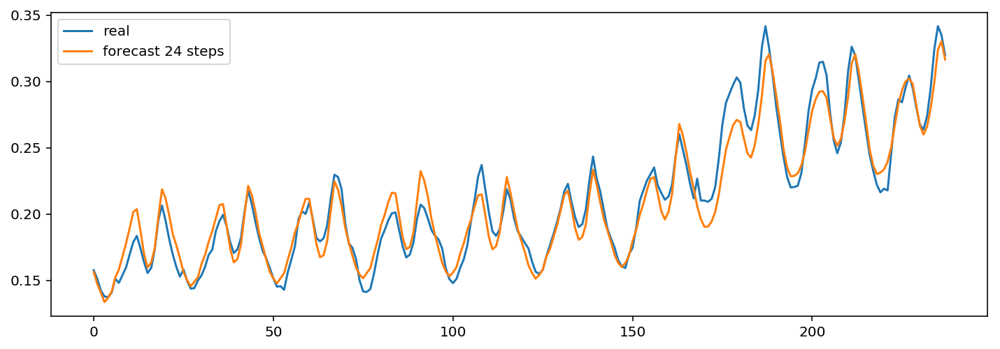

	 	 Forecasting a sample from Learning dataset


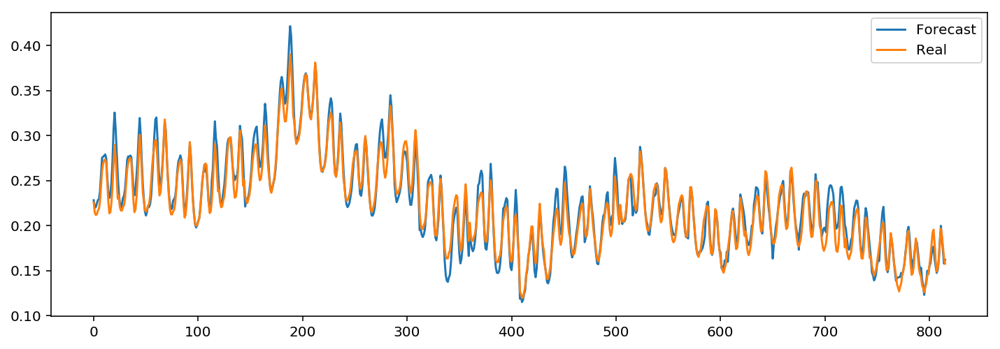

In [59]:
testPeriod= 240
season = 1


UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = False
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors

LSTM_Model = load_model('forecasting depending on Mixture clustering/Models/spring and autumn/lstm_84_2018-07-22')

clear_output()
print('==================================================================================')
print('\t \t proposed method performance')
print('==================================================================================')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastProApp, LearningHourlyForecast,forecasting_historyProApp  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,LSTM_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastProApp.index= range(LearningDailyForecastProApp.index.size)
plt.plot(LearningDailyForecastProApp.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastProApp.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()




-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 816 hours : 1.88400159781 
Daily Learning mean absolute percentage error of 34 days : 4.69454971788 
Hourly Learning mean absolute error of 816 hours : 0.00405512935928 
Daily Learning mean absolute error of 34 days : 0.0103591027371 
Hourly Learning root mean square error of 816 hours : 0.005545702765093215 
Daily Learning root mean square error of 34 days : 0.014159571657001074 
	 	 MAPError plot through Learning DataSet 


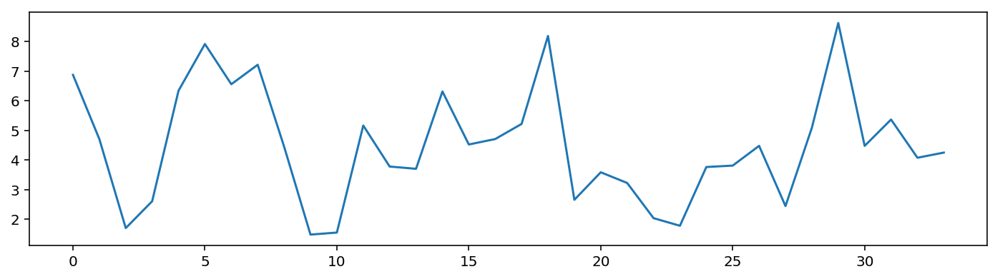

	 	 Test subset results
Test mean absolute percentage error per hour: 1.892693
Test mean absolute percentage error per day: 5.261697 
Test mean absolute error per hour: 0.003858
Test mean absolute error per day: 0.011080 
Test mean absolute error per hour: 0.004833
Test mean absolute error per day: 0.014232 
	 	 Validation Forecasting visualisation


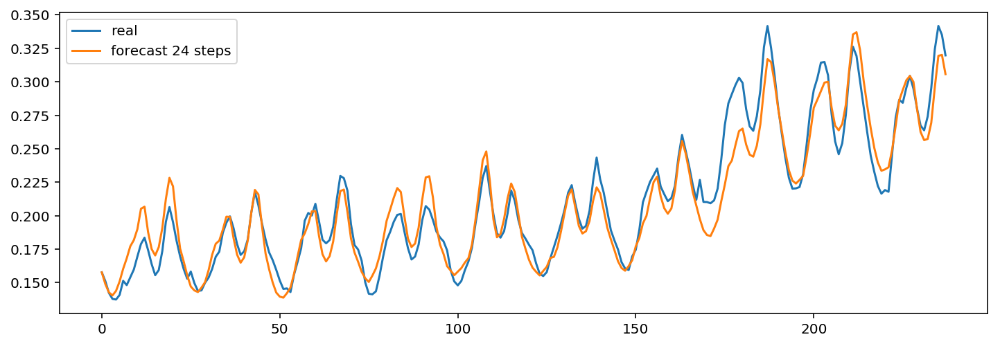

	 	 Forecasting a sample from Learning dataset


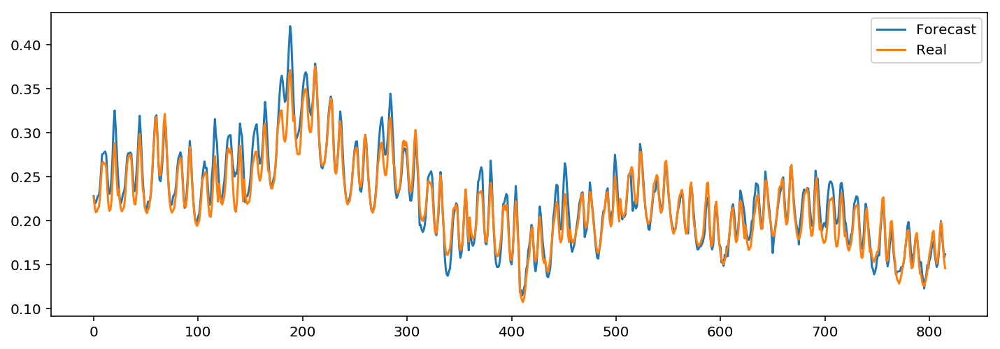

In [60]:

UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global MLP/mlp_1')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLP, LearningHourlyForecast, forecasting_historyMLP = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLP.index= range(LearningDailyForecastMLP.index.size)
plt.plot(LearningDailyForecastMLP.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLP.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()




-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 816 hours : 1.70532446414 
Daily Learning mean absolute percentage error of 34 days : 3.91295643994 
Hourly Learning mean absolute error of 816 hours : 0.00368496043476 
Daily Learning mean absolute error of 34 days : 0.00882059726872 
Hourly Learning root mean square error of 816 hours : 0.0050768102721981114 
Daily Learning root mean square error of 34 days : 0.011835720250158627 
	 	 MAPError plot through Learning DataSet 


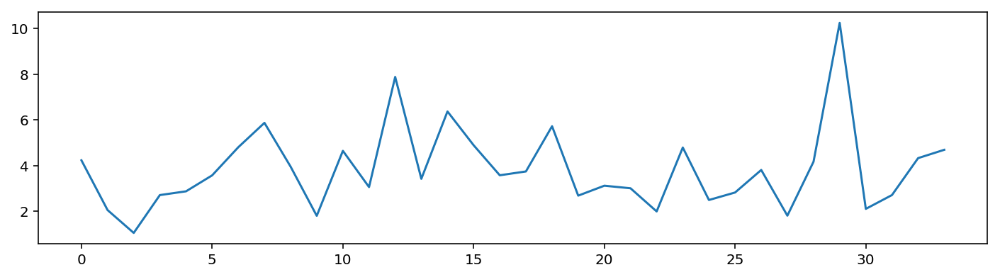

	 	 Test subset results
Test mean absolute percentage error per hour: 2.019761
Test mean absolute percentage error per day: 5.343642 
Test mean absolute error per hour: 0.004133
Test mean absolute error per day: 0.011079 
Test mean absolute error per hour: 0.005299
Test mean absolute error per day: 0.013770 
	 	 Validation Forecasting visualisation


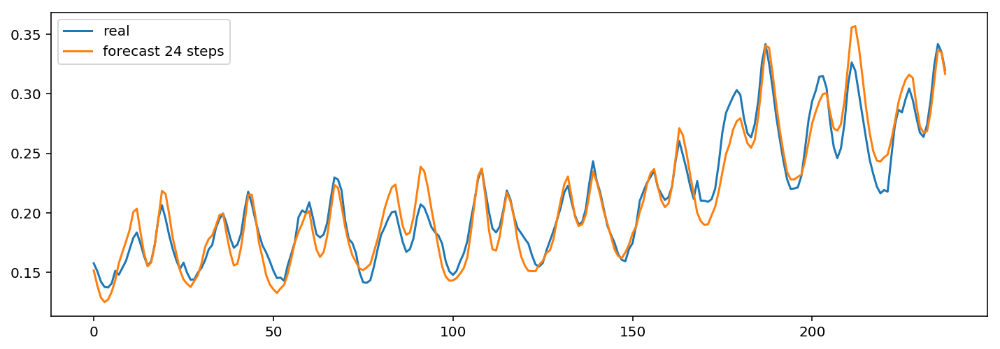

	 	 Forecasting a sample from Learning dataset


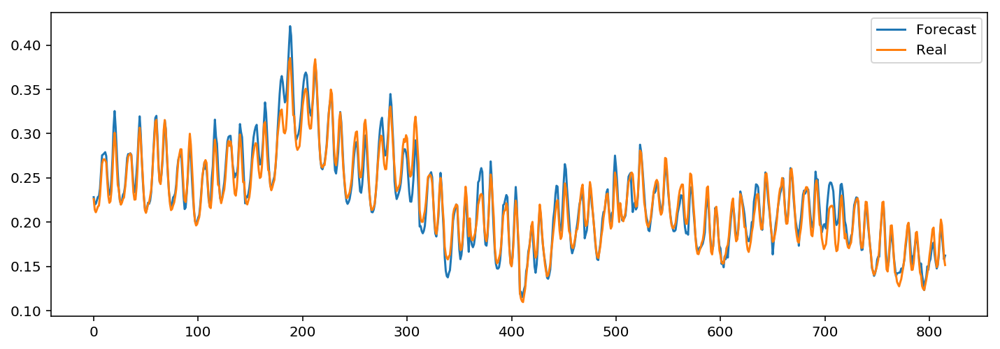

In [61]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global LSTM/lstm_2')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastLSTM, LearningHourlyForecast, forecasting_historyLSTM  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastLSTM.index= range(LearningDailyForecastLSTM.index.size)
plt.plot(LearningDailyForecastLSTM.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastLSTM.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()




-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 816 hours : 2.60240930905 
Daily Learning mean absolute percentage error of 34 days : 7.55605178288 
Hourly Learning mean absolute error of 816 hours : 0.00572116815382 
Daily Learning mean absolute error of 34 days : 0.0176224172234 
Hourly Learning root mean square error of 816 hours : 0.00738533001853428 
Daily Learning root mean square error of 34 days : 0.022475888176742273 
	 	 MAPError plot through Learning DataSet 


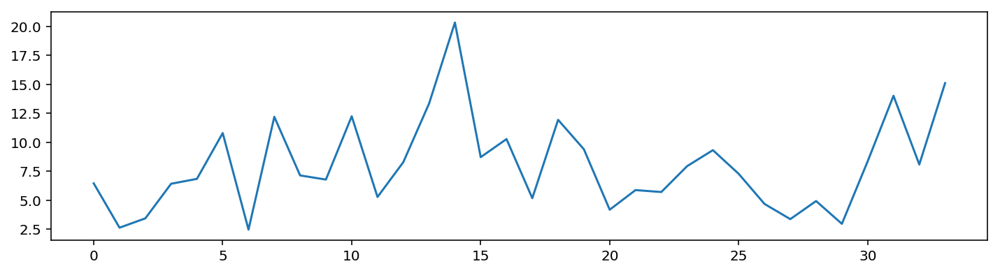

	 	 Test subset results
Test mean absolute percentage error per hour: 2.174110
Test mean absolute percentage error per day: 5.676610 
Test mean absolute error per hour: 0.004504
Test mean absolute error per day: 0.012160 
Test mean absolute error per hour: 0.005808
Test mean absolute error per day: 0.015178 
	 	 Validation Forecasting visualisation


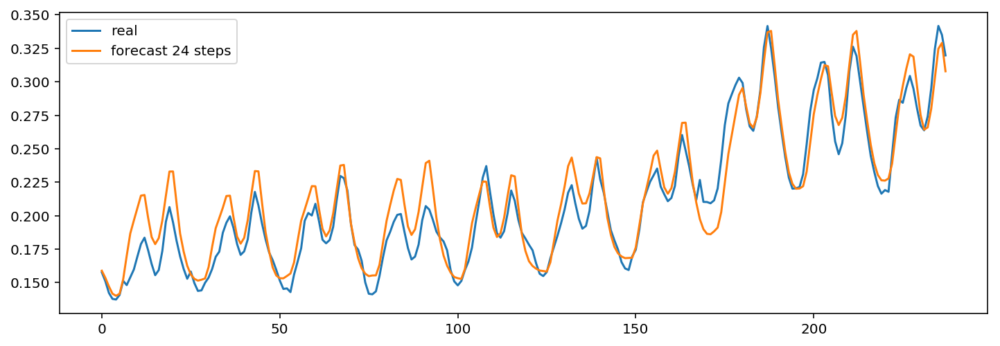

	 	 Forecasting a sample from Learning dataset


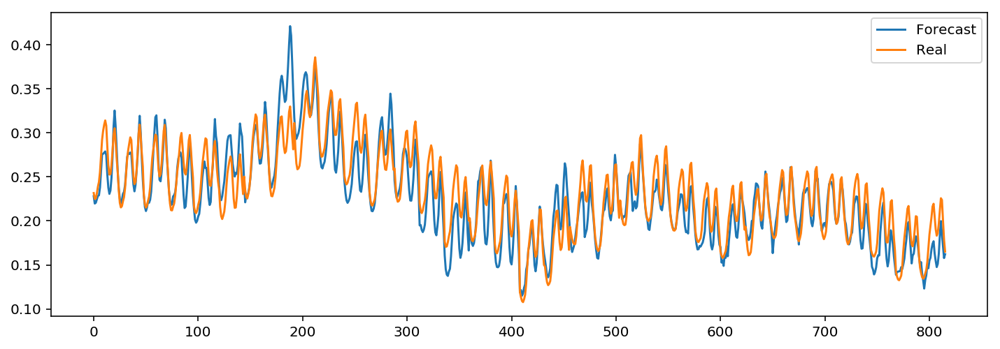

In [62]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLR_Model = sm.load(fname='Benchmarks/Models/Global MLR/mlr_5')
# MLP_Model=ModelsList[5]


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLR, LearningHourlyForecast, forecasting_historyMLR = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLR_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLR.index= range(LearningDailyForecastMLR.index.size)
plt.plot(LearningDailyForecastMLR.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLR.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()




	 	 SARIMAX method performance
	 	 Training subset results
Hourly Learning mean absolute percentage error of 816 hours : 2.09307500425 
Daily Learning mean absolute percentage error of 34 days : 6.04993631243 
Hourly Learning mean absolute error of 816 hours : 0.00449309392865 
Daily Learning mean absolute error of 34 days : 0.0140660120886 
Hourly Learning root mean square error of 816 hours : 0.006548421044888573 
Daily Learning root mean square error of 34 days : 0.019115401625585005 
	 	 Test subset results
Test mean absolute percentage error per hour: 1.769178
Test mean absolute percentage error per day: 5.036643 
Test mean absolute error per hour: 0.003668
Test mean absolute error per day: 0.010425 
Test root mean square error per hour: 0.012883
Test root mean square error per day: 0.012883 
	 	 Forecasting samples from Learning dataset


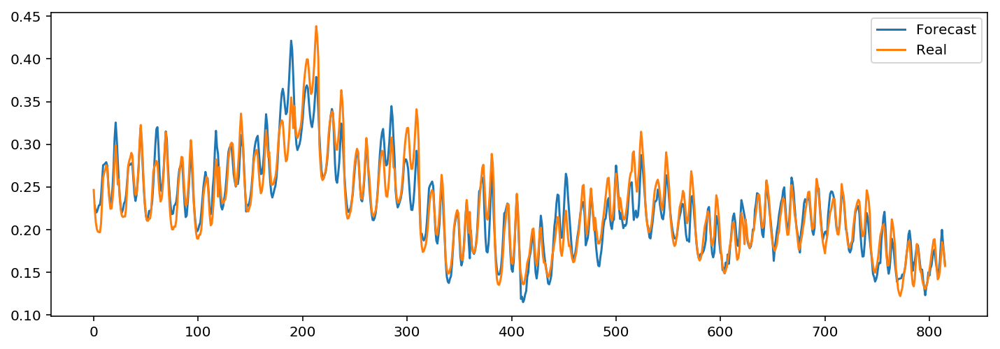

In [63]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])

UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

in1, out1, in2, out2, nbrInputs = prepareInputs2(daydata,season,UsedInputsTemp,testPeriod)

SARIMAX_Model = sm.load('Benchmarks/Models/Global SARIMAX/sarimax_test_8')

LearningDailyForecastSARIMAX = pd.DataFrame(np.random.randn(in1.index.size, 3),index=in1.index,columns=['real', 'forecast','1 step forecast'])
LearningDailyForecastSARIMAX['real']= out1[0].shift(1)

for x in range(0,(in1.index.size/24)):
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= False)




forecasting_historySARIMAX = pd.DataFrame(np.random.randn(in2.index.size, 3),index=in2.index,columns=['real', 'forecast','1 step forecast'])
forecasting_historySARIMAX['real']= out2[0].shift(1)

for x in range(0,(in2.index.size/24)):
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= False)




clear_output()
print('==================================================================================')
print('\t \t SARIMAX method performance')
print('==================================================================================')

print('==================================================================================')
print('\t \t Training subset results')
print('==================================================================================')


HlearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAPE))
print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAPE))

print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAE))
print('Daily Learning mean absolute error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAE))

print('Hourly Learning root mean square error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningRMSE))
print('Daily Learning root mean square error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningRMSE))




HtestMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])
testRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

print('==================================================================================')
print('\t \t Test subset results')
print('==================================================================================')


print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
print('Test mean absolute percentage error per day: %f ' %testMAPE)

print('Test mean absolute error per hour: %f' %HtestMAE)
print('Test mean absolute error per day: %f ' %testMAE)

print('Test root mean square error per hour: %f' %HtestRMSE)
print('Test root mean square error per day: %f ' %testRMSE)

print('==================================================================================')
print('\t \t Forecasting samples from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastSARIMAX.index= range(LearningDailyForecastSARIMAX.index.size)
plt.plot(LearningDailyForecastSARIMAX.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastSARIMAX.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()





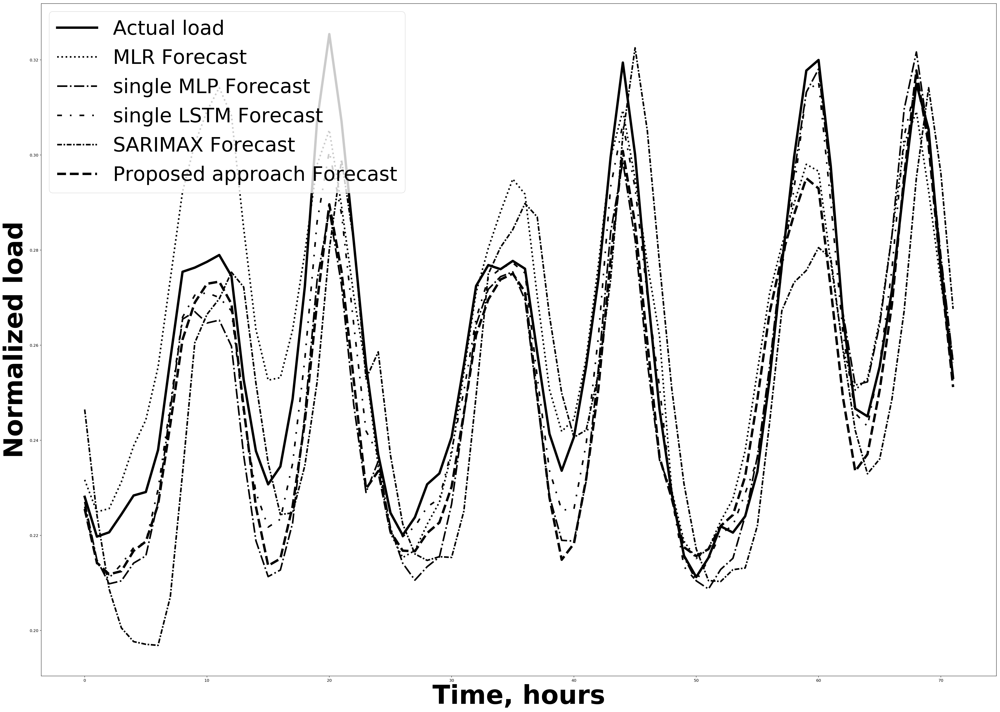

In [64]:
LearningDailyForecastProApp.iloc[:72,0].plot(label='Actual load',c='black',marker='.',linestyle='-',linewidth=6,figsize=(35,25))
LearningDailyForecastMLR.iloc[:72,1].plot(label='MLR Forecast',c='black',linewidth=4,linestyle=':')
LearningDailyForecastMLP.iloc[:72,1].plot(label='single MLP Forecast',c='black',linewidth=4,linestyle='-.')
LearningDailyForecastLSTM.iloc[:72,1].plot(label='single LSTM Forecast',c='black',linewidth=4,linestyle=(0, (3, 5, 1, 5)))
LearningDailyForecastSARIMAX.iloc[:72,1].plot(label='SARIMAX Forecast',c='black',linewidth=4,linestyle=(0, (3, 1, 1, 1)))
LearningDailyForecastProApp.iloc[:72,1].plot(label='Proposed approach Forecast',c='black',linewidth=6,linestyle='--')
plt.legend( fontsize= 50,loc='best', borderaxespad=0.4)
plt.ylabel('Normalized load',fontsize=65,weight='bold')
plt.xlabel('Time, hours',fontsize=65,weight='bold')

plt.tight_layout()
plt.savefig('SpringAndAutumn.pdf')

plt.show()




	 	 proposed method performance
	 	 learning subset results
Hourly Learning mean absolute percentage error of 3792 hours : 2.88284996911 
Daily Learning mean absolute percentage error of 158 days : 5.78249160388 
Hourly Learning mean absolute error of 3792 hours : 0.00240999446221 
Daily Learning mean absolute error of 158 days : 0.0051353662204 
Hourly Learning root mean square error of 3792 hours : 0.0033960156814413786 
Daily Learning root mean square error of 158 days : 0.007172094783642724 
	 	 MAPError plot through Learning DataSet 


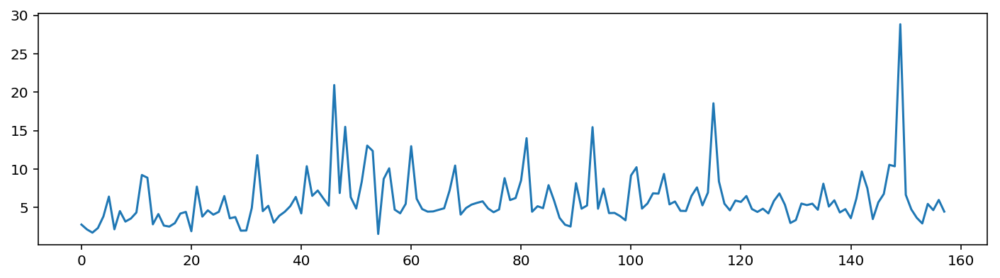

	 	 Test subset results
Test mean absolute percentage error per hour: 3.400685
Test mean absolute percentage error per day: 6.882034 
Test mean absolute error per hour: 0.003228
Test mean absolute error per day: 0.006246 
Test mean absolute error per hour: 0.004387
Test mean absolute error per day: 0.008748 
	 	 Validation Forecasting visualisation


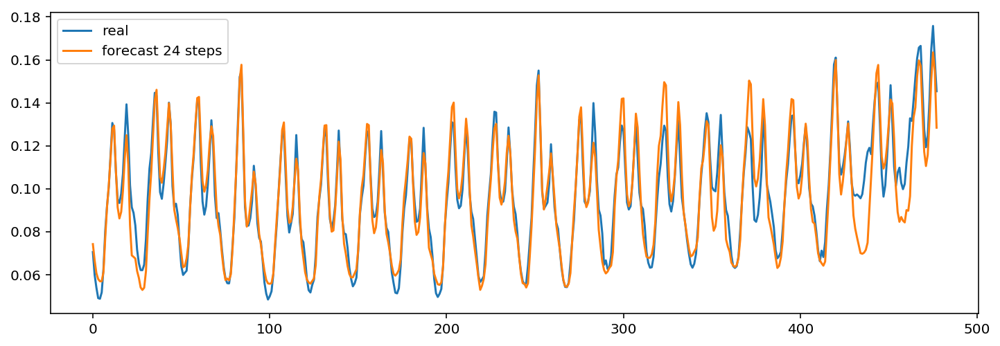

	 	 Forecasting a sample from Learning dataset


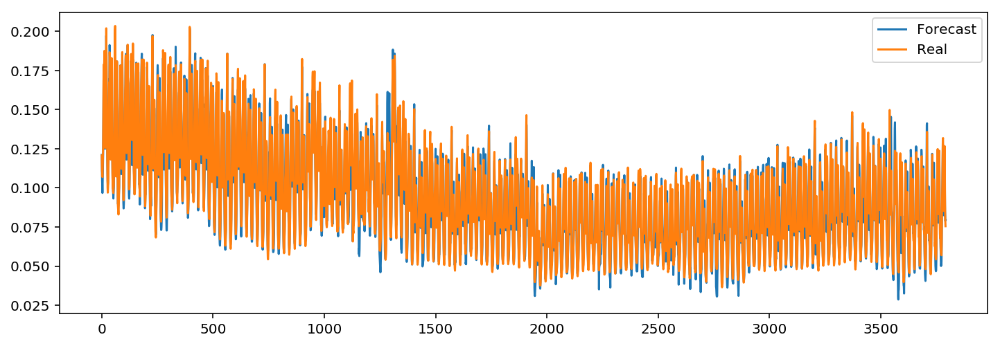

In [65]:
testPeriod= 480
season = 2


UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = HourIndicator = False

shift = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors

LSTM_Model = load_model('forecasting depending on Mixture clustering/Models/summer/lstm_1_2018-07-22')

clear_output()
print('==================================================================================')
print('\t \t proposed method performance')
print('==================================================================================')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastProApp, LearningHourlyForecast,forecasting_historyProApp  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,LSTM_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastProApp.index= range(LearningDailyForecastProApp.index.size)
plt.plot(LearningDailyForecastProApp.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastProApp.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()





-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 3792 hours : 3.47687101992 
Daily Learning mean absolute percentage error of 158 days : 6.62331652757 
Hourly Learning mean absolute error of 3792 hours : 0.00298198106335 
Daily Learning mean absolute error of 158 days : 0.00592422492614 
Hourly Learning root mean square error of 3792 hours : 0.004167578276097641 
Daily Learning root mean square error of 158 days : 0.00810757797109442 
	 	 MAPError plot through Learning DataSet 


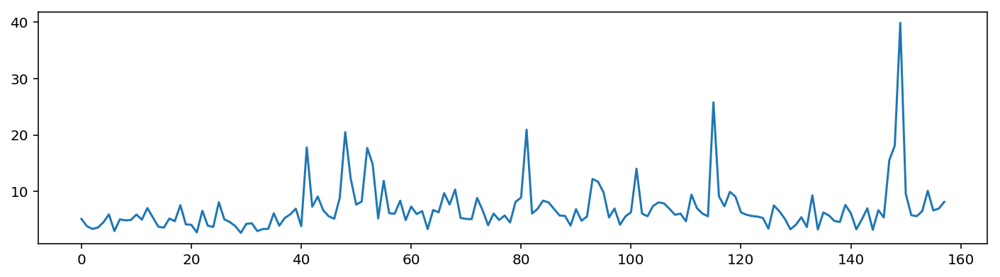

	 	 Test subset results
Test mean absolute percentage error per hour: 3.569480
Test mean absolute percentage error per day: 6.845366 
Test mean absolute error per hour: 0.003376
Test mean absolute error per day: 0.006191 
Test mean absolute error per hour: 0.004566
Test mean absolute error per day: 0.008075 
	 	 Validation Forecasting visualisation


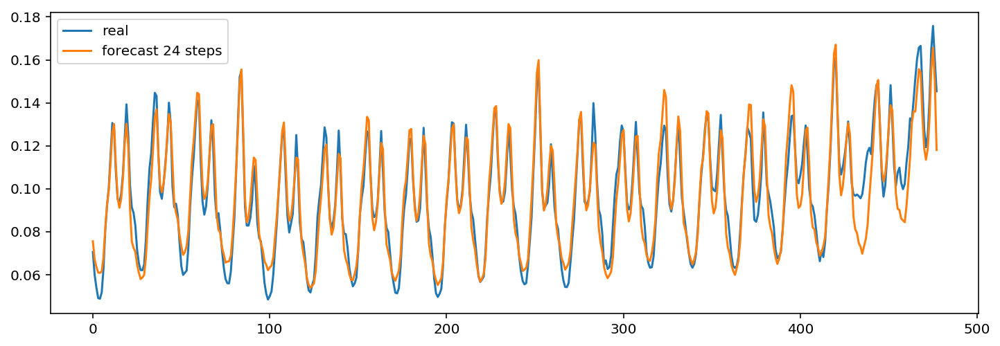

	 	 Forecasting a sample from Learning dataset


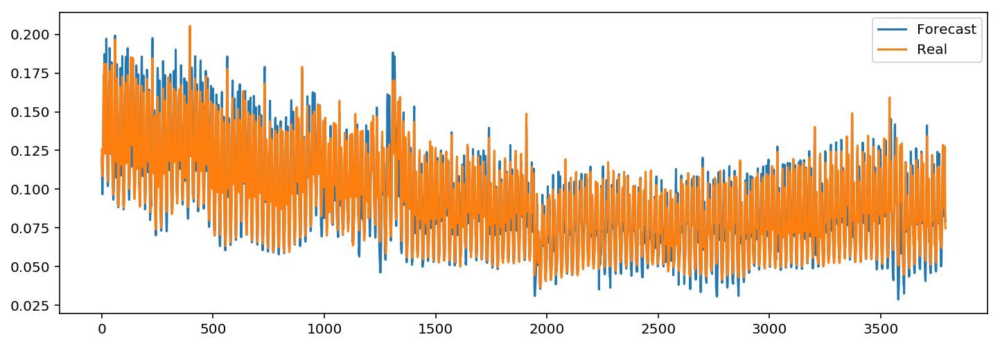

In [66]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global MLP/mlp_1')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLP, LearningHourlyForecast, forecasting_historyMLP = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLP.index= range(LearningDailyForecastMLP.index.size)
plt.plot(LearningDailyForecastMLP.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLP.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()





-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 3792 hours : 3.4617921047 
Daily Learning mean absolute percentage error of 158 days : 6.30356333823 
Hourly Learning mean absolute error of 3792 hours : 0.00294002600825 
Daily Learning mean absolute error of 158 days : 0.00547061472167 
Hourly Learning root mean square error of 3792 hours : 0.004061242288357951 
Daily Learning root mean square error of 158 days : 0.007539860948495873 
	 	 MAPError plot through Learning DataSet 


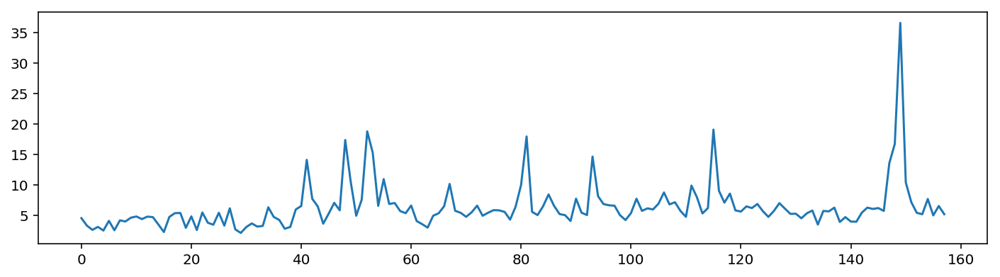

	 	 Test subset results
Test mean absolute percentage error per hour: 3.554618
Test mean absolute percentage error per day: 6.389183 
Test mean absolute error per hour: 0.003408
Test mean absolute error per day: 0.005998 
Test mean absolute error per hour: 0.004613
Test mean absolute error per day: 0.007930 
	 	 Validation Forecasting visualisation


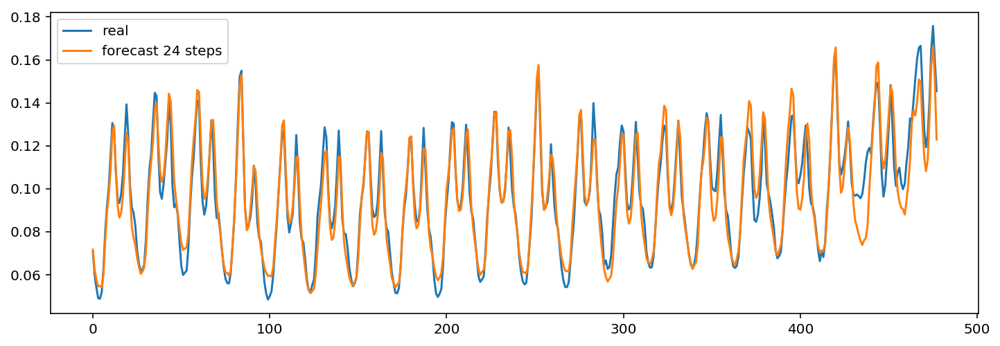

	 	 Forecasting a sample from Learning dataset


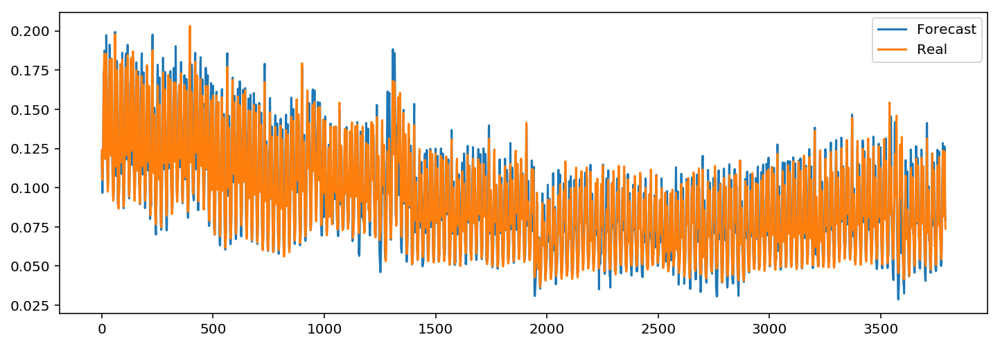

In [67]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLP_Model=load_model('Benchmarks/Models/Global LSTM/lstm_2')


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastLSTM, LearningHourlyForecast, forecasting_historyLSTM  = getForecastingResultsLSTM(
    learninginputs,learningoutputs,testinputs,testoutputs,MLP_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastLSTM.index= range(LearningDailyForecastLSTM.index.size)
plt.plot(LearningDailyForecastLSTM.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastLSTM.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()





-------Input preparation process complet-------
	 	 learning subset results
Hourly Learning mean absolute percentage error of 3792 hours : 4.64968666088 
Daily Learning mean absolute percentage error of 158 days : 9.94674940281 
Hourly Learning mean absolute error of 3792 hours : 0.00397405540653 
Daily Learning mean absolute error of 158 days : 0.00823724051029 
Hourly Learning root mean square error of 3792 hours : 0.005415907606956298 
Daily Learning root mean square error of 158 days : 0.01107825550850433 
	 	 MAPError plot through Learning DataSet 


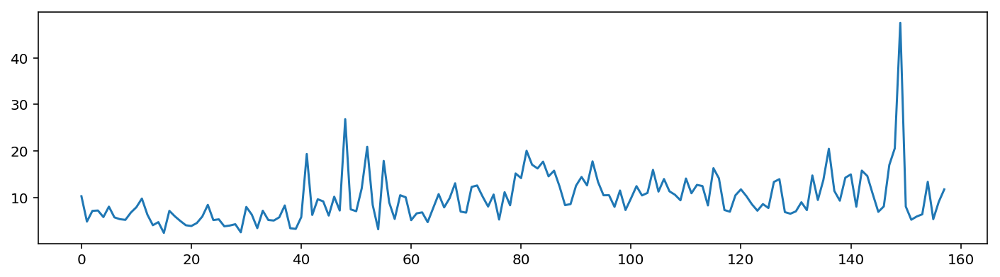

	 	 Test subset results
Test mean absolute percentage error per hour: 4.160830
Test mean absolute percentage error per day: 9.124501 
Test mean absolute error per hour: 0.004114
Test mean absolute error per day: 0.008890 
Test mean absolute error per hour: 0.005586
Test mean absolute error per day: 0.011613 
	 	 Validation Forecasting visualisation


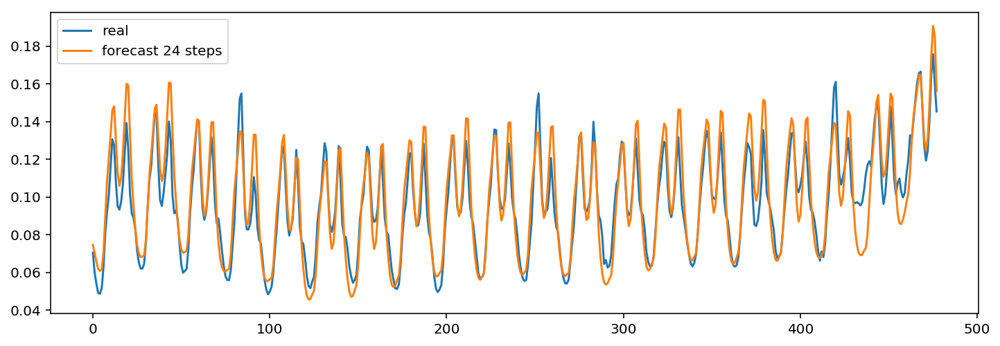

	 	 Forecasting a sample from Learning dataset


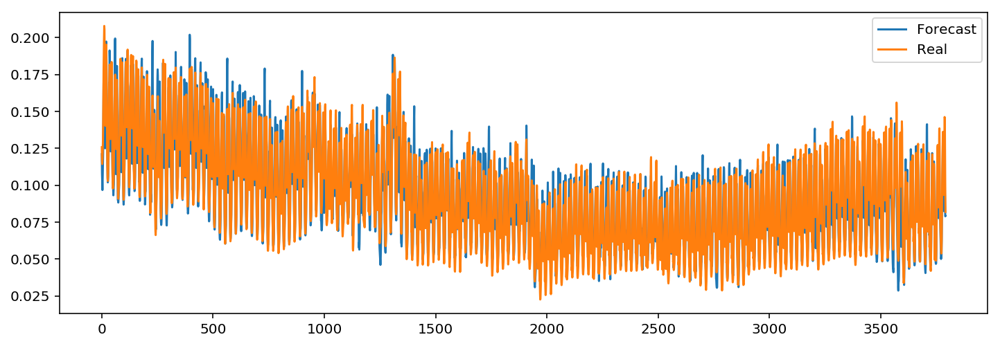

In [68]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])


UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 6
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False


learninginputs, learningoutputs, testinputs, testoutputs, nbrInputs = prepareInputs(daydata,season,UsedInputsTemp,testPeriod)
#learning vectors
inputx1 = np.array(pd.DataFrame(learninginputs.copy())).reshape(-1,nbrInputs)
outputx1 = np.array(pd.DataFrame(learningoutputs.copy()))

#test vectors
inputx2 = np.array(pd.DataFrame(testinputs.copy())).reshape(-1,nbrInputs)
outputx2 = np.array(pd.DataFrame(testoutputs.copy()))

MLR_Model = sm.load(fname='Benchmarks/Models/Global MLR/mlr_5')
# MLP_Model=ModelsList[5]


LearningMAPE, testMAPE , LearningHourlyMAPE, LearningDailyForecastMLR, LearningHourlyForecast, forecasting_historyMLR = getForecastingResults(
    learninginputs,learningoutputs,testinputs,testoutputs,MLR_Model,nbrInputs,shift,previoushour,timeSteps)
FinalErrorTemp[0] = LearningMAPE
FinalErrorTemp[1] = testMAPE


print('==================================================================================')
print('\t \t Forecasting a sample from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastMLR.index= range(LearningDailyForecastMLR.index.size)
plt.plot(LearningDailyForecastMLR.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastMLR.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()





	 	 SARIMAX method performance
	 	 Training subset results
Hourly Learning mean absolute percentage error of 3792 hours : 3.90550337215 
Daily Learning mean absolute percentage error of 158 days : 10.6171606348 
Hourly Learning mean absolute error of 3792 hours : 0.00327852577491 
Daily Learning mean absolute error of 158 days : 0.0084015657655 
Hourly Learning root mean square error of 3792 hours : 0.004809635656663933 
Daily Learning root mean square error of 158 days : 0.011184583161636025 
	 	 Test subset results
Test mean absolute percentage error per hour: 2.606349
Test mean absolute percentage error per day: 7.124314 
Test mean absolute error per hour: 0.002529
Test mean absolute error per day: 0.006443 
Test root mean square error per hour: 0.008569
Test root mean square error per day: 0.008569 
	 	 Forecasting samples from Learning dataset


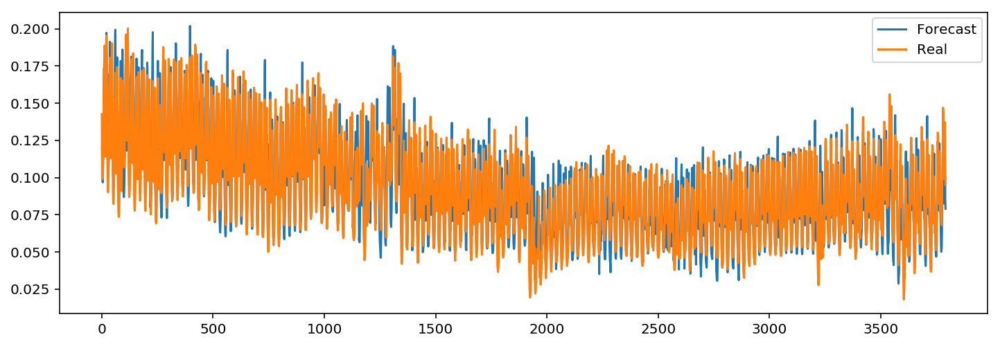

In [69]:
UsedInputsTemp= np.empty([10])
FinalErrorTemp= np.empty([2])
Parameters = np.empty([4])
ID= np.empty([1])

UsedInputsTemp[0] = previoushour = True
UsedInputsTemp[1] = timeSteps = 12
UsedInputsTemp[2] = previousDay = True
UsedInputsTemp[3] = previousWeek = True
UsedInputsTemp[4] = Temp = True
UsedInputsTemp[5] = TempMax = True
UsedInputsTemp[6] = TempMin = True
UsedInputsTemp[7] = dayIndicator = True
UsedInputsTemp[8] = HourIndicator = True
UsedInputsTemp[9] = MonthIndicator = False

shift = False

in1, out1, in2, out2, nbrInputs = prepareInputs2(daydata,season,UsedInputsTemp,testPeriod)

SARIMAX_Model = sm.load('Benchmarks/Models/Global SARIMAX/sarimax_test_8')

LearningDailyForecastSARIMAX = pd.DataFrame(np.random.randn(in1.index.size, 3),index=in1.index,columns=['real', 'forecast','1 step forecast'])
LearningDailyForecastSARIMAX['real']= out1[0].shift(1)

for x in range(0,(in1.index.size/24)):
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    LearningDailyForecastSARIMAX.loc[in1.index[x*24]:(in1.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in1.index[x*24], end= (in1.index[x*24]+ timedelta(hours=23)) , dynamic= False)




forecasting_historySARIMAX = pd.DataFrame(np.random.randn(in2.index.size, 3),index=in2.index,columns=['real', 'forecast','1 step forecast'])
forecasting_historySARIMAX['real']= out2[0].shift(1)

for x in range(0,(in2.index.size/24)):
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= True)
    forecasting_historySARIMAX.loc[in2.index[x*24]:(in2.index[x*24]+ timedelta(hours=23)),'1 step forecast'] = SARIMAX_Model.predict(start = in2.index[x*24], end= (in2.index[x*24]+ timedelta(hours=23)) , dynamic= False)




clear_output()
print('==================================================================================')
print('\t \t SARIMAX method performance')
print('==================================================================================')

print('==================================================================================')
print('\t \t Training subset results')
print('==================================================================================')


HlearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAPE= mean_absolute_percentage_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningMAE= mean_absolute_error(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

HlearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,2], LearningDailyForecastSARIMAX.iloc[:,0])
LearningRMSE= rmse(LearningDailyForecastSARIMAX.iloc[:,1], LearningDailyForecastSARIMAX.iloc[:,0])

print('Hourly Learning mean absolute percentage error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAPE))
print('Daily Learning mean absolute percentage error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAPE))

print('Hourly Learning mean absolute error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningMAE))
print('Daily Learning mean absolute error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningMAE))

print('Hourly Learning root mean square error of %d hours : %s ' %(LearningDailyForecastSARIMAX.shape[0] , HlearningRMSE))
print('Daily Learning root mean square error of %d days : %s ' %(LearningDailyForecastSARIMAX.shape[0]/24 ,LearningRMSE))




HtestMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAPE= mean_absolute_percentage_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,2], forecasting_historySARIMAX.iloc[:,0])
testMAE= mean_absolute_error(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

HtestRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])
testRMSE= rmse(forecasting_historySARIMAX.iloc[:,1], forecasting_historySARIMAX.iloc[:,0])

print('==================================================================================')
print('\t \t Test subset results')
print('==================================================================================')


print('Test mean absolute percentage error per hour: %f' %HtestMAPE)
print('Test mean absolute percentage error per day: %f ' %testMAPE)

print('Test mean absolute error per hour: %f' %HtestMAE)
print('Test mean absolute error per day: %f ' %testMAE)

print('Test root mean square error per hour: %f' %HtestRMSE)
print('Test root mean square error per day: %f ' %testRMSE)

print('==================================================================================')
print('\t \t Forecasting samples from Learning dataset')
print('==================================================================================')
plt.figure(figsize=(12,4))
LearningDailyForecastSARIMAX.index= range(LearningDailyForecastSARIMAX.index.size)
plt.plot(LearningDailyForecastSARIMAX.iloc[:,0],label='Forecast')
plt.plot(LearningDailyForecastSARIMAX.iloc[:,1],label='Real')
plt.legend( loc=1, borderaxespad=0.4)
plt.show()






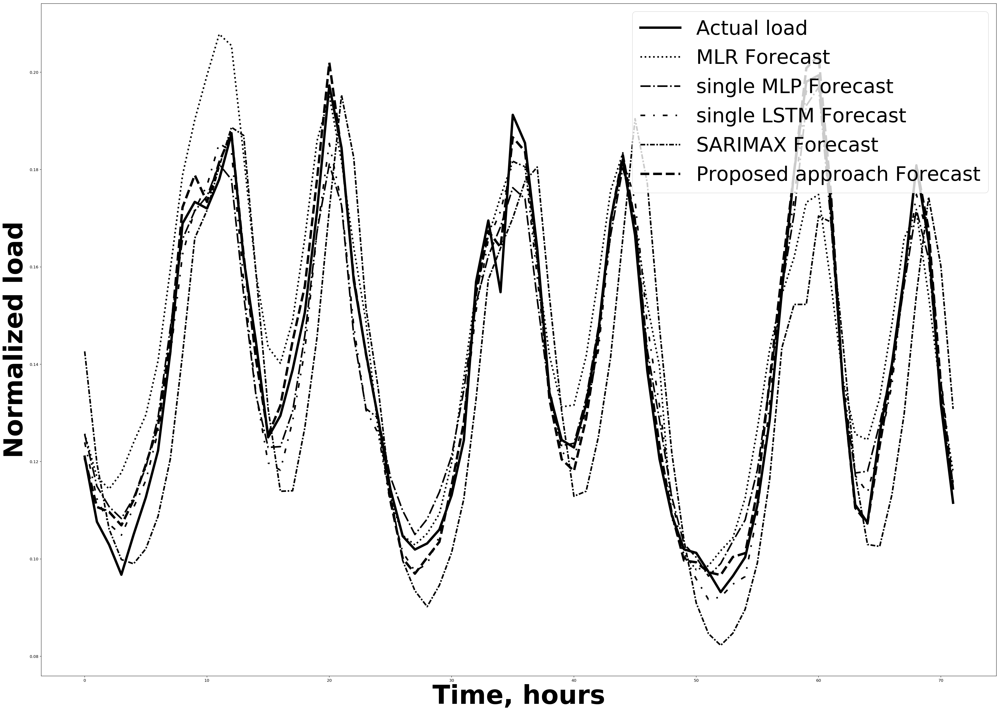

In [70]:
LearningDailyForecastProApp.iloc[:72,0].plot(label='Actual load',c='black',marker='.',linestyle='-',linewidth=6,figsize=(35,25))
LearningDailyForecastMLR.iloc[:72,1].plot(label='MLR Forecast',c='black',linewidth=4,linestyle=':')
LearningDailyForecastMLP.iloc[:72,1].plot(label='single MLP Forecast',c='black',linewidth=4,linestyle='-.')
LearningDailyForecastLSTM.iloc[:72,1].plot(label='single LSTM Forecast',c='black',linewidth=4,linestyle=(0, (3, 5, 1, 5)))
LearningDailyForecastSARIMAX.iloc[:72,1].plot(label='SARIMAX Forecast',c='black',linewidth=4,linestyle=(0, (3, 1, 1, 1)))
LearningDailyForecastProApp.iloc[:72,1].plot(label='Proposed approach Forecast',c='black',linewidth=6,linestyle='--')
plt.legend( fontsize= 50,loc='best', borderaxespad=0.4)
plt.ylabel('Normalized load',fontsize=65,weight='bold')
plt.xlabel('Time, hours',fontsize=65,weight='bold')

plt.tight_layout()
plt.savefig('Summer.pdf')

plt.show()
